# Introduction

## Project Title
Crunching the Numbers: A Comprehensive Data Analysis of the Indian Startup Ecosystem from 2018-2021.

## Business Understanding

In order to comprehend the factors that lead to start-up success, the problem entails analyzing the funding received by start-ups in India from 2018 to 2021. The objective is to find patterns and trends in the data on financing amounts, investor details, and start-up information and to use these revelations to make inferences about the traits of Indian start-ups that are likely to succeed. Utilizing statistical techniques and methods, the study may look at the effects of start-up performance on funding levels, investor diversity, location, industry specialization, innovation, and founding team experience. Investors, business people, and policy makers who want to comprehend the dynamics of the Indian start-up ecosystem and come up with ideas such as start-up promotion may find the analysis' findings helpful.

## Hypothesis
- Null Hypothesis
Companies whose headquaters are located in the Indian capital city, New delhi) receive more funding than that of those located other cities

- Alternate Hypothesis
Companies whose headquaters are located in the Indian capital city, New delhi) does not necessarilly receive more funding than that of those located in other cities

## Questions

- Are start-ups located in specific areas more likely to succeed or to receive more financing than those located other areas?

- Has the amount of investments in the ecosystem increased over the 4 year span (the datasets we are looking at), or has it decreased?


- What is the median investment amount received by Indian startups at different stages of their growth?


- Does the nature of the industry has any impact on the amount of funding received?

- Which startup (s) had the highest rate/count of funding (this counts the startup that occured most but not with duplicate funding)?


# Installation

In [7]:
# pip install geocoder==1.0.6

# pip install geopy 



# Libraries Importation

In [8]:
##data handling

import pandas as pd 

import numpy as np

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

##data visualization

import seaborn as sns

import matplotlib.pyplot as plt

##Others

import warnings
warnings.filterwarnings('ignore') ##to handle warnings

##for geolocation

from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="my-custom-agent", timeout=20)



A local browser window will open for interactive sign in.

Interactive authentication successfully completed.
You are now logged in.

The result should be passed only to trusted code in your notebook.


# Data Loading

In [9]:
#Data paths
path_2018 =  "Desktop/Pandas/Azubi/LP1/startup_funding2018.csv" #'startup_funding2018.csv' 
path_2019 =  "Desktop/Pandas/Azubi/LP1/startup_funding2019.csv" #'startup_funding2019.csv'
path_2020 =  "Desktop/Pandas/Azubi/LP1/startup_funding2020.csv" #'startup_funding2020.csv'
path_2021 =  "Desktop/Pandas/Azubi/LP1/startup_funding2021.csv" #'startup_funding2021.csv'


startup_2018= pd.read_csv(path_2018)

startup_2019= pd.read_csv(path_2019)

startup_2020= pd.read_csv(path_2020)

startup_2021= pd.read_csv(path_2021)

since we will eventually concatenate them together, we will like to add a new column with the year of each dataset to help us differentiate the year of each row

In [10]:
##Adding the year column

startup_2018["Year"]= "2018"
startup_2019["Year"]= "2019"
startup_2020["Year"]= "2020"
startup_2021["Year"]= "2021"

# Exploratory Data Analysis: EDA

In this section, we will inspect the datasets in-depth, present it, make hypotheses and clean it and visualize the dataset

## Dataset overview

In [11]:
startup_2018.info()




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526 entries, 0 to 525
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company Name   526 non-null    object
 1   Industry       526 non-null    object
 2   Round/Series   526 non-null    object
 3   Amount         526 non-null    object
 4   Location       526 non-null    object
 5   About Company  526 non-null    object
 6   Year           526 non-null    object
dtypes: object(7)
memory usage: 28.9+ KB


In [12]:
startup_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89 entries, 0 to 88
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  89 non-null     object 
 1   Founded        60 non-null     float64
 2   HeadQuarter    70 non-null     object 
 3   Sector         84 non-null     object 
 4   What it does   89 non-null     object 
 5   Founders       86 non-null     object 
 6   Investor       89 non-null     object 
 7   Amount($)      89 non-null     object 
 8   Stage          43 non-null     object 
 9   Year           89 non-null     object 
dtypes: float64(1), object(9)
memory usage: 7.1+ KB


In [13]:
startup_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055 entries, 0 to 1054
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  1055 non-null   object
 1   Founded        843 non-null    object
 2   HeadQuarter    961 non-null    object
 3   Sector         1042 non-null   object
 4   What it does   1055 non-null   object
 5   Founders       1043 non-null   object
 6   Investor       1017 non-null   object
 7   Amount($)      1052 non-null   object
 8   Stage          591 non-null    object
 9   Unnamed: 9     2 non-null      object
 10  Year           1055 non-null   object
dtypes: object(11)
memory usage: 90.8+ KB


In [14]:
startup_2021.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1209 entries, 0 to 1208
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  1209 non-null   object 
 1   Founded        1208 non-null   float64
 2   HeadQuarter    1208 non-null   object 
 3   Sector         1209 non-null   object 
 4   What it does   1209 non-null   object 
 5   Founders       1205 non-null   object 
 6   Investor       1147 non-null   object 
 7   Amount($)      1206 non-null   object 
 8   Stage          781 non-null    object 
 9   Year           1209 non-null   object 
dtypes: float64(1), object(9)
memory usage: 94.6+ KB


### Summary of the dataset overview:

- The 2018 dataset had 3 columns missing

- The 2019 dataset had an extra column named: "Unnamed:9" which we will have to check out
    
- The Amount column is an object data type so we will need to deal with that

NOTE: We will deal with all these and more in the preprocessing stage

## Preprocessing

In this section, we will take a look at each column of each dataset by:

- Checking for duplicated row for each dataset

- Check for any descripancies in each column of each dataset. 

- We will use Crunchbase and the Web to find and fill any missing rows

- Check the datatype of each column of each dataset

### Analyzing 2018 Dataset

In [15]:
#We will check for duplicated rows
startup_2018[startup_2018["Company Name"].duplicated(keep=False)].sort_values(by="Company Name")

,Company Name,Industry,Round/Series,Amount,Location,About Company,Year
0,TheCollegeFever,"Brand Marketing, Event Promotion, Marketing, S...",Seed,250000,"Bangalore, Karnataka, India","TheCollegeFever is a hub for fun, fiesta and f...",2018
348,TheCollegeFever,"Brand Marketing, Event Promotion, Marketing, S...",Seed,250000,"Bangalore, Karnataka, India","TheCollegeFever is a hub for fun, fiesta and f...",2018


In [16]:
# drops the first instance

startup_2018.drop(0, axis= 0, inplace= True)

In [17]:
#checks each column for discrapencies
startup_2018["Company Name"]

1                                        Happy Cow Dairy
2                                             MyLoanCare
3                                            PayMe India
4                                               Eunimart
5                                                 Hasura
6                                              Tripshelf
7                                           Hyperdata.IO
8                                           Freightwalla
9                                     Microchip Payments
10                            BizCrum Infotech Pvt. Ltd.
11                                               Emojifi
12                                                 Flock
13                                             Freshboxx
14                            Wide Mobility Mechatronics
15                                               Pitstop
16                                                Mihuru
17                                                  Fyle
18                             

In [18]:
# No discrapencies were observed (Company Name)
# Checking through the Industry column of the 2018 dataset for any discrapencies

startup_2018["Industry"]

1                                   Agriculture, Farming
2       Credit, Financial Services, Lending, Marketplace
3                            Financial Services, FinTech
4                     E-Commerce Platforms, Retail, SaaS
5                       Cloud Infrastructure, PaaS, SaaS
6                         Internet, Leisure, Marketplace
7                                        Market Research
8           Information Services, Information Technology
9                                        Mobile Payments
10                                            B2B, Shoes
11                                              Internet
12     Apps, Collaboration, Developer Platform, Enter...
13                                         Food Delivery
14                                 Industrial Automation
15           Automotive, Search Engine, Service Industry
16                             Finance, Internet, Travel
17     Accounting, Business Information Systems, Busi...
18     Artificial Intelligence,

#### Notes on the Industry Column of the 2018 dataset
1. The Industry section featured Sectors and subsectors, so, we will only take the first index since it is the sector

2. Some sections were represented with "-", so we will represent them with np.nan as well

In [19]:
# Fetches the first index of the sectors
startup_2018["Industry"]= startup_2018["Industry"].str.split(",").str[0]

# Replaces all _ with np.nan

startup_2018["Industry"]= startup_2018.Industry.replace("—", np.nan)

In [20]:
 # Filters the Industry column to verify changes

startup_2018["Industry"]

1                             Agriculture
2                                  Credit
3                      Financial Services
4                    E-Commerce Platforms
5                    Cloud Infrastructure
6                                Internet
7                         Market Research
8                    Information Services
9                         Mobile Payments
10                                    B2B
11                               Internet
12                                   Apps
13                          Food Delivery
14                  Industrial Automation
15                             Automotive
16                                Finance
17                             Accounting
18                Artificial Intelligence
19                     Internet of Things
20                     Air Transportation
21                     Financial Services
22                      Food and Beverage
23                    Autonomous Vehicles
24                    Enterprise S

In [21]:
#No descrapencies observed in the Industry column so we proceed to the next column

In [22]:
startup_2018["Round/Series"].unique()

array(['Seed', 'Series A', 'Angel', 'Series B', 'Pre-Seed',
       'Private Equity', 'Venture - Series Unknown', 'Grant',
       'Debt Financing', 'Post-IPO Debt', 'Series H', 'Series C',
       'Series E', 'Corporate Round', 'Undisclosed',
       'https://docs.google.com/spreadsheets/d/1x9ziNeaz6auNChIHnMI8U6kS7knTr3byy_YBGfQaoUA/edit#gid=1861303593',
       'Series D', 'Secondary Market', 'Post-IPO Equity',
       'Non-equity Assistance', 'Funding Round'], dtype=object)

##### Issues with the 2018 Round/Series Column
1. https://docs.google.com/spreadsheets/d/1x9ziNeaz6auNChIHnMI8U6kS7knTr3byy_YBGfQaoUA/edit#gid=1861303593
2. Undisclosed

In [23]:
#Columns will be filtered and replaced with their actual values

In [24]:
#Finding the first discrapency:
startup_2018[startup_2018["Round/Series"]=="https://docs.google.com/spreadsheets/d/1x9ziNeaz6auNChIHnMI8U6kS7knTr3byy_YBGfQaoUA/edit#gid=1861303593"]

,Company Name,Industry,Round/Series,Amount,Location,About Company,Year
178,BuyForexOnline,Travel,https://docs.google.com/spreadsheets/d/1x9ziNe...,2000000,"Bangalore, Karnataka, India",BuyForexOnline.com is India's first completely...,2018


In [25]:
#Replacing the first discrapency with the actual value
startup_2018.loc[178, "Round/Series"]= "Seed"

In [26]:
#finding rows with the second discrapency:

startup_2018[startup_2018["Round/Series"]=="Undisclosed"]

,Company Name,Industry,Round/Series,Amount,Location,About Company,Year
164,Classworks India,Education,Undisclosed,"₹100,000","Chennai, Tamil Nadu, India","Saas, Web App, Mobile App, School Education",2018
406,Traveo Soft Pvt. Ltd.,Mobile,Undisclosed,"₹1,200,000","Bangalore, Karnataka, India",AI based Business Travel & Expense management,2018


In [27]:
## Replaces the second discrapency in the Round/Series column of the 2018 with np.nan

startup_2018.loc[164, "Round/Series"]= np.nan
startup_2018.loc[406, "Round/Series"]= np.nan

In [28]:
#There are no other descrapencies in the Round/Series column so we proceed to the next column

In [29]:
startup_2018["Amount"].unique()

array(['₹40,000,000', '₹65,000,000', '2000000', '—', '1600000',
       '₹16,000,000', '₹50,000,000', '₹100,000,000', '150000', '1100000',
       '₹500,000', '6000000', '650000', '₹35,000,000', '₹64,000,000',
       '₹20,000,000', '1000000', '5000000', '4000000', '₹30,000,000',
       '2800000', '1700000', '1300000', '₹5,000,000', '₹12,500,000',
       '₹15,000,000', '500000', '₹104,000,000', '₹45,000,000', '13400000',
       '₹25,000,000', '₹26,400,000', '₹8,000,000', '₹60,000', '9000000',
       '100000', '20000', '250000', '120000', '₹34,000,000',
       '₹342,000,000', '$143,145', '₹600,000,000', '$742,000,000',
       '₹1,000,000,000', '₹2,000,000,000', '$3,980,000', '$10,000',
       '₹100,000', '₹250,000,000', '$1,000,000,000', '$7,000,000',
       '$35,000,000', '₹550,000,000', '$28,500,000', '$2,000,000',
       '₹240,000,000', '₹120,000,000', '$2,400,000', '$30,000,000',
       '₹2,500,000,000', '$23,000,000', '$150,000', '$11,000,000',
       '₹44,000,000', '$3,240,000', '₹60

### Issues with the Amount column of the 2018 dataset:

Some of the amount in the Amount column of the 2018 dataset were in dollars instead of rupees. So, we will convert all rupees to dollars

Certain rows in the Amount column were represented with "-". We will represent those with np.nan

Certain rows had no demonination, so we will assume they are in dollars

In [30]:
##We will get rid of all the "," to make our cleaning easier

startup_2018["Amount"]= startup_2018.Amount.apply(lambda x:str(x).replace(",", ""))
## next we will filter out all the rows in the amount column containting "₹"

rupees_mask = startup_2018['Amount'].str.contains('₹')

## we convert it to a dataframe

rupees_df = startup_2018[rupees_mask].copy()

rupees_df['Amount'] = rupees_df['Amount'].str.replace('₹', '')


rupees_df['Amount'] = rupees_df['Amount'].astype(float)

##we will conver it to dollars using the 2018 dollar rate since the dataset is from 2018

dollar_rate_2018= 68.4113

rupees_df['Amount'] = round(rupees_df['Amount'] /dollar_rate_2018 , 0)

##we will convert it back to a string to reattach it to our original dataframe 

rupees_df['Amount'] = rupees_df['Amount'].astype(str)

## Now let's replace the columns with rupees in our original dataset with the converted one

startup_2018.loc[rupees_mask, 'Amount'] = rupees_df['Amount'].values

##Now let's strip the dollar sign from the rows with it

startup_2018['Amount'] = startup_2018['Amount'].str.replace('$', '')

In [31]:
startup_2018['Amount']

1         584699.0
2         950135.0
3          2000000
4                —
5          1600000
6         233879.0
7         730873.0
8                —
9                —
10               —
11               —
12               —
13               —
14               —
15       1461747.0
16          150000
17         1100000
18               —
19          7309.0
20         6000000
21          650000
22        511611.0
23        935518.0
24               —
25               —
26         2000000
27         2000000
28         2000000
29               —
30        292349.0
31         1000000
32               —
33          650000
34         1000000
35         5000000
36         4000000
37        438524.0
38         1000000
39         2800000
40               —
41          150000
42        584699.0
43         1000000
44         1700000
45               —
46         1300000
47         2000000
48               —
49         73087.0
50        292349.0
51        584699.0
52        292349.0
53         1

In [32]:
# We will finally replace all "-" with np.nan 

startup_2018["Amount"]=startup_2018["Amount"].replace("—", np.nan)

In [33]:
startup_2018["Amount"]

1         584699.0
2         950135.0
3          2000000
4              NaN
5          1600000
6         233879.0
7         730873.0
8              NaN
9              NaN
10             NaN
11             NaN
12             NaN
13             NaN
14             NaN
15       1461747.0
16          150000
17         1100000
18             NaN
19          7309.0
20         6000000
21          650000
22        511611.0
23        935518.0
24             NaN
25             NaN
26         2000000
27         2000000
28         2000000
29             NaN
30        292349.0
31         1000000
32             NaN
33          650000
34         1000000
35         5000000
36         4000000
37        438524.0
38         1000000
39         2800000
40             NaN
41          150000
42        584699.0
43         1000000
44         1700000
45             NaN
46         1300000
47         2000000
48             NaN
49         73087.0
50        292349.0
51        584699.0
52        292349.0
53         1

In [34]:
##Since there are no more discrapencies in the Amount column of the 2018 dataset, we will proceed to the next column

In [35]:
startup_2018["Location"]

1            Mumbai, Maharashtra, India
2               Gurgaon, Haryana, India
3           Noida, Uttar Pradesh, India
4      Hyderabad, Andhra Pradesh, India
5           Bengaluru, Karnataka, India
6                 Kalkaji, Delhi, India
7      Hyderabad, Andhra Pradesh, India
8            Mumbai, Maharashtra, India
9           Bangalore, Karnataka, India
10                  Delhi, Delhi, India
11          Bengaluru, Karnataka, India
12                          India, Asia
13              Hubli, Karnataka, India
14          Bangalore, Karnataka, India
15          Bengaluru, Karnataka, India
16           Mumbai, Maharashtra, India
17          Bengaluru, Karnataka, India
18              New Delhi, Delhi, India
19           Chennai, Tamil Nadu, India
20           Mumbai, Maharashtra, India
21           Mumbai, Maharashtra, India
22              New Delhi, Delhi, India
23                  Delhi, Delhi, India
24          Bengaluru, Karnataka, India
25                Mohali, Punjab, India


##### Issues with the 2018 Location Column:
1.All columns had their cities and state. Since we need the cities the companies where located, we will take those. From observations, the location of each company where the first index, so we will take only that.

In [36]:
startup_2018["Location"]= startup_2018["Location"].str.split(",").str[0]

In [37]:
startup_2018["Location"]

1              Mumbai
2             Gurgaon
3               Noida
4           Hyderabad
5           Bengaluru
6             Kalkaji
7           Hyderabad
8              Mumbai
9           Bangalore
10              Delhi
11          Bengaluru
12              India
13              Hubli
14          Bangalore
15          Bengaluru
16             Mumbai
17          Bengaluru
18          New Delhi
19            Chennai
20             Mumbai
21             Mumbai
22          New Delhi
23              Delhi
24          Bengaluru
25             Mohali
26            Chennai
27             Mumbai
28             Mumbai
29          Hyderabad
30          New Delhi
31            Kolkata
32          Bangalore
33          Bengaluru
34             Mumbai
35          Bengaluru
36             Mumbai
37          New Delhi
38             Mumbai
39            Chennai
40          New Delhi
41          Hyderabad
42              India
43             Mumbai
44          New Delhi
45          New Delhi
46        

In [38]:
# We will proceed to the next column since no discrapencies is being detected

In [39]:
startup_2018["About Company"]

1      A startup which aggregates milk from dairy far...
2              Leading Online Loans Marketplace in India
3      PayMe India is an innovative FinTech organizat...
4      Eunimart is a one stop solution for merchants ...
5      Hasura is a platform that allows developers to...
6      Tripshelf is an online market place for holida...
7      Hyperdata combines advanced machine learning w...
8      Freightwalla is an international forwarder tha...
9      Microchip payments is a mobile-based payment a...
10              Building Transactionary B2B Marketplaces
11     Emojifi is an app that provides live emoji, st...
12     Flock is a real-time messaging and collaborati...
13     Freshboxx is incubated at Sandbox Startups, a ...
14     Wide Mobility Mechatronics is a Private Compan...
15     Pitstop offers general repair and maintenance ...
16     Mihuru is an online platform which gives micro...
17     Fyle is an intelligent expense management plat...
18     Appwharf is an intellige

In [40]:
# Since there are no discrapencies, we will make check the datatypes

#### Checking Datatypes

In [41]:
startup_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525 entries, 1 to 525
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company Name   525 non-null    object
 1   Industry       495 non-null    object
 2   Round/Series   523 non-null    object
 3   Amount         377 non-null    object
 4   Location       525 non-null    object
 5   About Company  525 non-null    object
 6   Year           525 non-null    object
dtypes: object(7)
memory usage: 28.8+ KB


##### Issues with the datatypes
- The Amount column is an object datatype; therefore, We will change the Amount column to int

In [42]:
#Chaning the Amount column from object datatype to an int datatype


startup_2018['Amount'] = pd.to_numeric(startup_2018['Amount'])

startup_2018["Amount"]=startup_2018["Amount"].replace(np.nan, 0)

startup_2018["Amount"]=startup_2018["Amount"].astype(int)

In [43]:
startup_2018

,Company Name,Industry,Round/Series,Amount,Location,About Company,Year
1,Happy Cow Dairy,Agriculture,Seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018
2,MyLoanCare,Credit,Series A,950135,Gurgaon,Leading Online Loans Marketplace in India,2018
3,PayMe India,Financial Services,Angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018
4,Eunimart,E-Commerce Platforms,Seed,0,Hyderabad,Eunimart is a one stop solution for merchants ...,2018
5,Hasura,Cloud Infrastructure,Seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018
6,Tripshelf,Internet,Seed,233879,Kalkaji,Tripshelf is an online market place for holida...,2018
7,Hyperdata.IO,Market Research,Angel,730873,Hyderabad,Hyperdata combines advanced machine learning w...,2018
8,Freightwalla,Information Services,Seed,0,Mumbai,Freightwalla is an international forwarder tha...,2018
9,Microchip Payments,Mobile Payments,Seed,0,Bangalore,Microchip payments is a mobile-based payment a...,2018
10,BizCrum Infotech Pvt. Ltd.,B2B,Seed,0,Delhi,Building Transactionary B2B Marketplaces,2018


#### Final Notes On the 2018 dataset
It has three missing columns, namely:

- Founders 
- Founded 
- Investor



### Checking the 2019 Dataset

In [44]:
#### We will check for duplicated rows

In [45]:
startup_2019[startup_2019["Company/Brand"].duplicated(keep=False)].sort_values(by="Company/Brand")

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
7,Kratikal,2013.0,Noida,Technology,It is a product-based cybersecurity solutions ...,"Pavan Kushwaha, Paratosh Bansal, Dip Jung Thapa","Gilda VC, Art Venture, Rajeev Chitrabhanu.","$1,000,000",Pre series A,2019
82,Kratikal,NaN,Uttar pradesh,Technology,Provides cyber security solutions,Pavan Kushwaha,"Gilda VC, Art Venture, Rajeev Chitrabhanu","$1,000,000",Pre-series A,2019
30,Licious,NaN,Bangalore,Food,Online meat shop,"Vivek Gupta, Abhay Hanjura",Vertex Growth Fund,"$30,000,000",Series E,2019
68,Licious,2015.0,Bangalore,Food,Online meat shop,"Vivek Gupta, Abhay Hanjura",Vertex Ventures,"$25,000,000",Series D,2019


In [46]:
# Drops only one instance of the Kratikal company since both columns are the same 

# Drops index 82 because the actual location is Noida and they are similar

startup_2019.drop(82, axis= 0, inplace=True)

#### We will check each columns for discrapencies

In [47]:
startup_2019["Company/Brand"]

0                   Bombay Shaving
1                        Ruangguru
2                         Eduisfun
3                         HomeLane
4                         Nu Genes
5                         FlytBase
6                            Finly
7                         Kratikal
8                        Quantiphi
9                         Lenskart
10                      Cub McPaws
11                        Appnomic
12                      Kaleidofin
13                       JobSquare
14                     Open Secret
15                          LivFin
16                          Byju's
17                      Zest Money
18                         Witblox
19    Azah Personal Care Pvt. Ltd.
20                      SalaryFits
21                    Pristyn Care
22                     Springboard
23              DROR Labs Pvt. Ltd
24                         Medlife
25                         Seekify
26                Toffee Insurance
27                   Fireflies .ai
28                  

In [48]:
# Since there are no discrapencies we will move to the next column

In [49]:
startup_2019["Founded"].unique()

array([  nan, 2014., 2004., 2013., 2010., 2018., 2019., 2017., 2011.,
       2015., 2016., 2012., 2008.])

In [50]:
#Since there are no discrapencies we will move to the next column

In [51]:
startup_2019["HeadQuarter"].unique()

array([nan, 'Mumbai', 'Chennai', 'Telangana', 'Pune', 'Bangalore',
       'Noida', 'Delhi', 'Ahmedabad', 'Gurugram', 'Haryana', 'Chandigarh',
       'Jaipur', 'New Delhi', 'Surat', 'Hyderabad', 'Rajasthan'],
      dtype=object)

In [52]:
#Since there are no discrapencies we will move to the next column

In [53]:
startup_2019["Sector"]

0                        Ecommerce
1                           Edtech
2                           Edtech
3                  Interior design
4                         AgriTech
5                       Technology
6                             SaaS
7                       Technology
8                        AI & Tech
9                       E-commerce
10                 E-commerce & AR
11                            SaaS
12                         Fintech
13                         HR tech
14                       Food tech
15                         Fintech
16                          Edtech
17                         Fintech
18                          Edtech
19                          Health
20                         Fintech
21                      Healthcare
22                          Edtech
23                     Safety tech
24                  Pharmaceutical
25                            SaaS
26            Insurance technology
27                              AI
28                  

In [54]:
#Since there are no discrapencies we will move to the next column

In [55]:
startup_2019["What it does"]

0            Provides a range of male grooming products
1     A learning platform that provides topic-based ...
2               It aims to make learning fun via games.
3                 Provides interior designing solutions
4     It is a seed company engaged in production, pr...
5                           A drone automation platform
6     It builds software products that makes work si...
7     It is a product-based cybersecurity solutions ...
8     It is an AI and big data services company prov...
9                               It is a eyewear company
10    A B2C  brand that focusses on premium and comf...
11    It is a self-healing enterprise, the IT operat...
12    Platform that provides complete financial solu...
13    Technology-based platform that is connecting s...
14             It produces and sells top quality snacks
15    Grants small business loans, supply chain fina...
16                     Provides online learning classes
17    Uses AI to do risk profiling of e-commerce

In [56]:
# since there are no discrapencies, we will move to the next column

In [57]:
startup_2019["Founders"]

0                                    Shantanu Deshpande
1                 Adamas Belva Syah Devara, Iman Usman.
2                                         Jatin Solanki
3                          Srikanth Iyer, Rama Harinath
4                                Narayana Reddy Punyala
5                                           Nitin Gupta
6                             Vivek AG, Veekshith C Rai
7       Pavan Kushwaha, Paratosh Bansal, Dip Jung Thapa
8                                        Renuka Ramnath
9          Peyush Bansal, Amit Chaudhary, Sumeet Kapahi
10                              Abhay Bhat, Kinnar Shah
11                                        D Padmanabhan
12                    Puneet Gupta, Sucharita Mukherjee
13                                         Ishit Jethwa
14                          Ahana Gautam, Udit Kejriwal
15                                      Rakesh Malhotra
16                                      Byju Raveendran
17           Chapman, Priya Sharma, Ashish Anant

#### Issues with the Founders column of the 2019 dataset:
- A row read: "Team of Waterloo-based software developers"

- We will find the row and make the necessary corrections

In [58]:
startup_2019[startup_2019["Founders"]== "Team of Waterloo-based software developers"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
70,Zebu,2015.0,NaN,Cybersecurity,Platform uses encryption technology to allow b...,Team of Waterloo-based software developers,Undisclosed,"$4,000,000",Seed round,2019


In [59]:
startup_2019.loc[70, "Founders"]= " Jesse David Thé"
startup_2019.loc[70, "HeadQuarter"]= "Waterloo"

In [60]:
# Since there are no more discrapencies we will proceed to the next column

In [61]:
startup_2019["Investor"].unique()

array(['Sixth Sense Ventures', 'General Atlantic',
       'Deepak Parekh, Amitabh Bachchan, Piyush Pandey',
       'Evolvence India Fund (EIF), Pidilite Group, FJ Labs',
       'Innovation in Food and Agriculture (IFA)', 'Undisclosed',
       'Social Capital, AngelList India, Gemba Capital, Omphalos Ventures,\xa0\xa091springboard via Atal Innovation Mission, Niti Aayog.',
       'Gilda VC, Art Venture, Rajeev Chitrabhanu.',
       'Multiples Alternate Asset Management', 'SoftBank',
       'Venture Catalysts', 'Avataar Ventures', 'Oikocredit',
       'Titan Capital', 'Matrix Partners',
       'German development finance institution DEG',
       'South Africa’s Naspers Ventures, the CPP Investment Board',
       'Goldman Sachs.', 'Mumbai Angels Network',
       'Kunal Bahl, Rohit Bansal.', 'Brazilian VC Fund Confrapar',
       'Sequoia India, Hummingbird Ventures, Greenoaks Capital, AngelList.',
       'Reach Capital', 'Inflection Point Ventures',
       'Wilson Global Opportunities Fund

In [62]:
startup_2019["Amount($)"].unique()

array(['$6,300,000', '$150,000,000', '$28,000,000', '$30,000,000',
       '$6,000,000', 'Undisclosed', '$1,000,000', '$20,000,000',
       '$275,000,000', '$22,000,000', '$5,000,000', '$140,500',
       '$540,000,000', '$15,000,000', '$182,700', '$12,000,000',
       '$11,000,000', '$15,500,000', '$1,500,000', '$5,500,000',
       '$2,500,000', '$140,000', '$230,000,000', '$49,400,000',
       '$32,000,000', '$26,000,000', '$150,000', '$400,000', '$2,000,000',
       '$100,000,000', '$8,000,000', '$100,000', '$50,000,000',
       '$120,000,000', '$4,000,000', '$6,800,000', '$36,000,000',
       '$5,700,000', '$25,000,000', '$600,000', '$70,000,000',
       '$60,000,000', '$220,000', '$2,800,000', '$2,100,000',
       '$7,000,000', '$311,000,000', '$4,800,000', '$693,000,000',
       '$33,000,000'], dtype=object)

#### Issues with the Amount column of the 2019 dataset
-We will replace the columns with "Undisclosed" with np.nan

In [63]:
startup_2019["Amount($)"]=startup_2019["Amount($)"].replace("Undisclosed", np.nan)

In [64]:
# Since there are no more discrapencies we will proceed to the next column

In [65]:
startup_2019["Stage"].unique()

array([nan, 'Series C', 'Fresh funding', 'Series D', 'Pre series A',
       'Series A', 'Series G', 'Series B', 'Post series A',
       'Seed funding', 'Seed fund', 'Series E', 'Series F', 'Series B+',
       'Seed round'], dtype=object)

##### Issues with the 2019 Stage column:

-Some rows were represented with various variation of "Seed" funding stage. So, We will change the following to "Seed":

- Seed funding
- Seed fund
- Fresh funding
- Seed round

In [66]:
startup_2019[startup_2019["Stage"]=="Seed funding"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
25,Seekify,2019.0,Delhi,SaaS,Customer Experience (CX) Automation platform,"Arihant Jain, Ajeet Kushwaha",Sequoia Capita,"$1,500,000",Seed funding,2019


In [67]:
startup_2019.loc[25, "Stage"]="Seed"

In [68]:
startup_2019[startup_2019["Stage"]=="Fresh funding"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
2,Eduisfun,NaN,Mumbai,Edtech,It aims to make learning fun via games.,Jatin Solanki,"Deepak Parekh, Amitabh Bachchan, Piyush Pandey","$28,000,000",Fresh funding,2019


In [69]:
startup_2019.loc[2, "Stage"]="Seed"

In [70]:
startup_2019[startup_2019["Stage"]=="Seed round"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
70,Zebu,2015.0,Waterloo,Cybersecurity,Platform uses encryption technology to allow b...,Jesse David Thé,Undisclosed,"$4,000,000",Seed round,2019


In [71]:
startup_2019.loc[70, "Stage"]="Seed"

In [72]:
startup_2019[startup_2019["Stage"]=="Seed fund"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
29,Bijak,2019.0,NaN,AgriTech,B2B platform for agricultural commodities.,"Nukul Upadhye, Mahesh Jakhotia, Jitender Bedwa...","Omnivore and Omidyar Network India, Sequoia Ca...","$2,500,000",Seed fund,2019


In [73]:
startup_2019.loc[29, "Stage"]="Seed"

In [74]:
#Since there are no more discrapencies, we will check the datatypes

In [75]:
#### Checking the datatypes of each column of the 2019 dataset

In [76]:
startup_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88 entries, 0 to 88
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  88 non-null     object 
 1   Founded        60 non-null     float64
 2   HeadQuarter    70 non-null     object 
 3   Sector         83 non-null     object 
 4   What it does   88 non-null     object 
 5   Founders       85 non-null     object 
 6   Investor       88 non-null     object 
 7   Amount($)      76 non-null     object 
 8   Stage          42 non-null     object 
 9   Year           88 non-null     object 
dtypes: float64(1), object(9)
memory usage: 9.6+ KB


##### Issues with the datatypes of the 2019 dataset:

- We will have to change the Amount column and Founded Column to int

In [77]:
##First, we will deal with the Amount column:

#-We will strip all the "," and $

startup_2019["Amount($)"]= startup_2019["Amount($)"].apply(lambda x:str(x).replace(",", ""))
startup_2019["Amount($)"]= startup_2019["Amount($)"].apply(lambda x:str(x).replace("$", ""))

##We will replace all np.nan with 0 and convert the column to int

startup_2019["Amount($)"]= startup_2019["Amount($)"].apply(lambda x:str(x).replace("nan", "0"))

startup_2019["Amount($)"]=startup_2019["Amount($)"].astype(int)

# #Saving corrected data
# startup_2019.to_csv("corrected_startup_2019.csv")

startup_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88 entries, 0 to 88
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  88 non-null     object 
 1   Founded        60 non-null     float64
 2   HeadQuarter    70 non-null     object 
 3   Sector         83 non-null     object 
 4   What it does   88 non-null     object 
 5   Founders       85 non-null     object 
 6   Investor       88 non-null     object 
 7   Amount($)      88 non-null     int32  
 8   Stage          42 non-null     object 
 9   Year           88 non-null     object 
dtypes: float64(1), int32(1), object(8)
memory usage: 9.3+ KB


In [78]:
#Now, we will deal with the founded column:
    


startup_2019["Founded"]=startup_2019["Founded"].replace(np.nan, 0)

startup_2019["Founded"]=startup_2019["Founded"].astype(int)

startup_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88 entries, 0 to 88
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  88 non-null     object
 1   Founded        88 non-null     int32 
 2   HeadQuarter    70 non-null     object
 3   Sector         83 non-null     object
 4   What it does   88 non-null     object
 5   Founders       85 non-null     object
 6   Investor       88 non-null     object
 7   Amount($)      88 non-null     int32 
 8   Stage          42 non-null     object
 9   Year           88 non-null     object
dtypes: int32(2), object(8)
memory usage: 8.9+ KB


In [79]:
# Now we proceed to the next dataset

### Checking the 2020 Dataset 

#### Checking For Duplicated Row In The 2020 Dataset

In [80]:
startup_2020[startup_2020["Company/Brand"].duplicated(keep=False)].sort_values(by="Company/Brand")

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Unnamed: 9,Year
419,Airmeet,2019,Bangalore,Tech Startup,Airmeet is an all-in-one events platform for v...,"Lalit Mangal, Manoj Singh, Vinay Kumar Jasti","Global Founders Capital, Redpoint","$12,000,000",Series A,NaN,2020
852,Airmeet,NaN,Bangalore,Media & Networking,"A platform to host, discover, and attend fully...","Lalit Mangal, Vinay Jaasti, Manoj Singh",Accel India,"$3,000,000",NaN,NaN,2020
884,AjnaLens,2014,Thane,Deeptech,"It leverages technologies such as AR, VR & AI ...","Pankaj Raut, Abhishek Tomar, Abhijit Patil","Maharashtra Defence, Aerospace Venture Fund (M...","$1,500,000",Pre series A,NaN,2020
177,AjnaLens,2014,Thane,AR/VR startup,AjnaLens develops AR/VR wearables primarily fo...,"Abhijit Patil, Abhishek Tomar, Pankaj Raut","Mohsin Hani Al Bahrani, MoD","$1,000,000",Bridge,NaN,2020
862,Arya,NaN,Noida,Agritech,Provides post-harvest services across the agri...,Prasanna Rao,LGT Lightstone Aspada,"$6,000,000",Series B,NaN,2020
30,Arya,1982,Noida,AgriTech,"""Simplifying Agribusiness"" Throughout Agri-Sup...","Chattanathan Devarajan, Prasanna Rao, Anand Ch...",Quona Capital,"$21,000,000",Series B,NaN,2020
222,Arzooo,2016,Bangalore,Retail Tech,"Retail tech platform empowering 300,000+ small...","Khushnud Khan, Rishi Raj Rathore","3Lines, Jabbar Internet Group","$7,500,000",Series A,NaN,2020
143,Arzooo,2016,Bangalore,Tech Startup,"B2B retail tech platform transforming 300,000+...","Khushnud Khan, Rishi Raj Rathore","3Lines, Jabbar Internet Group",Undisclosed,NaN,NaN,2020
559,Ather Energy,2013,Bangalore,Automobile,Electric scooter manufacturer,"Tarun Mehta, Swapnil Jain",Hero MotoCorp,"$11,241,000",Series C,NaN,2020
167,Ather Energy,2013,Bangalore,Automobiles,Ather Energy is a manufacturer of electric sco...,"Arun Vinayak, Swapnil Jain, Tarun Mehta",HeroMotoCorp Ltd and Sachin Bansal,"$35,000,000",Series D,NaN,2020


There were the duplicated rows. 

- 212
- 129
- 424
- 426
- 120
- 782
- 258
- 785
- 902
- 326
- 100
- 206
- 502
- 120
- 728
- 258
- 785
- 964


#### Let's Check Each Column for Discrapencies

In [81]:
startup_2020.columns

Index(['Company/Brand', 'Founded', 'HeadQuarter', 'Sector', 'What it does',
       'Founders', 'Investor', 'Amount($)', 'Stage', 'Unnamed: 9', 'Year'],
      dtype='object')

In [82]:
##the only different column is 'Unnamed: 9'. Let's explore it to see
startup_2020["Unnamed: 9"]

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
5              NaN
6              NaN
7              NaN
8              NaN
9              NaN
10             NaN
11             NaN
12             NaN
13             NaN
14             NaN
15             NaN
16             NaN
17             NaN
18             NaN
19             NaN
20             NaN
21             NaN
22             NaN
23             NaN
24             NaN
25             NaN
26             NaN
27             NaN
28             NaN
29             NaN
30             NaN
31             NaN
32             NaN
33             NaN
34             NaN
35             NaN
36             NaN
37             NaN
38             NaN
39             NaN
40             NaN
41             NaN
42             NaN
43             NaN
44             NaN
45             NaN
46             NaN
47             NaN
48             NaN
49             NaN
50             NaN
51             NaN
52          

In [83]:
#### about 99% of the column are nan values, so we will go ahead and drop it

startup_2020.drop("Unnamed: 9", axis= 1, inplace=True)

In [84]:
# Let's proceed to review the relevant columns

In [85]:
startup_2020["Company/Brand"]

0                                  Aqgromalin
1                                    Krayonnz
2                                PadCare Labs
3                                       NCOME
4                                  Gramophone
5                                      qZense
6                                MyClassboard
7                                       Metvy
8                                      Rupeek
9                                   Gig India
10                                Slurrp Farm
11                                     Medfin
12                                    MasterG
13                                   Brila 91
14                                 FoodyBuddy
15                                     Zomato
16                                  OurEye.ai
17                                 Shiprocket
18                                  Pine Labs
19                          Moneyboxx Finance
20                                       EWar
21                         SucSEED

In [86]:
# Since there are no discrapencies, we will proceed to the next column

In [87]:
startup_2020["Founded"].unique()

array(['2019', '2018', '2020', '2016', '2008', '2015', '2017', '2014',
       '1998', '2007', '2011', '1982', '2013', '2009', '2012', '1995',
       '2010', '2006', '1978', nan, '1999', '1994', '2005', '1973', '-',
       '2002', '2004', '2001'], dtype=object)

##### Issues with the 2020 founded column:

- Certain cells were represented by "-", so we will find them and deal with them

In [88]:
startup_2020[startup_2020["Founded"]== "-"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
482,PurohitJi,-,Bangalore,Linguistic Spiritual,App for Hindu Puja Products & Services,Nakerikanti Harish,Bhadresh,Undisclosed,NaN,2020


In [89]:
## using crunchbase, we got the founded year to be 2018

startup_2020.loc[482, "Founded"]= "2018"

In [90]:
# Since there are no more discrapencies, we will proceed to the next column

In [91]:
startup_2020["HeadQuarter"].unique()

array(['Chennai', 'Bangalore', 'Pune', 'New Delhi', 'Indore', 'Hyderabad',
       'Gurgaon', 'Belgaum', 'Noida', 'Mumbai', 'Andheri', 'Jaipur',
       'Ahmedabad', 'Kolkata', 'Tirunelveli, Tamilnadu', 'Thane', nan,
       'Singapore', 'Gurugram', 'Gujarat', 'Haryana', 'Kerala', 'Jodhpur',
       'Jaipur, Rajastan', 'Delhi', 'Frisco, Texas, United States',
       'California', 'Dhingsara, Haryana', 'New York, United States',
       'Patna', 'San Francisco, California, United States',
       'San Francisco, United States', 'San Ramon, California',
       'Paris, Ile-de-France, France', 'Plano, Texas, United States',
       'Sydney', 'San Francisco Bay Area, Silicon Valley, West Coast',
       'Bangaldesh', 'London, England, United Kingdom',
       'Sydney, New South Wales, Australia', 'Milano, Lombardia, Italy',
       'Palmwoods, Queensland, Australia', 'France',
       'San Francisco Bay Area, West Coast, Western US',
       'Trivandrum, Kerala, India', 'Cochin', 'Samastipur, Bihar',
 

##### Issues with the HeadQuarter column of the 2020 dataset:
- Some companies had thier country, and states present. 
So, we will split the column with a "," and choose the first index

In [92]:
startup_2020["HeadQuarter"]=startup_2020["HeadQuarter"].str.split(",").str[0]

In [93]:
startup_2020["HeadQuarter"]

0                      Chennai
1                    Bangalore
2                         Pune
3                    New Delhi
4                       Indore
5                    Bangalore
6                    Hyderabad
7                      Gurgaon
8                    Bangalore
9                         Pune
10                     Gurgaon
11                   Bangalore
12                   New Delhi
13                   New Delhi
14                     Belgaum
15                     Gurgaon
16                   Bangalore
17                   New Delhi
18                       Noida
19                   New Delhi
20                   Bangalore
21                   Hyderabad
22                      Mumbai
23                   Bangalore
24                     Gurgaon
25                      Mumbai
26                   Bangalore
27                   Bangalore
28                   Bangalore
29                     Gurgaon
30                       Noida
31                   New Delhi
32      

In [94]:
###Since there are no more disparaties, we will move to the next column

In [95]:
startup_2020["Sector"].unique()

array(['AgriTech', 'EdTech', 'Hygiene management', 'Escrow',
       'Networking platform', 'FinTech', 'Crowdsourcing',
       'Food & Bevarages', 'HealthTech', 'Fashion startup',
       'Food Industry', 'Food Delivery', 'Virtual auditing startup',
       'E-commerce', 'Gaming', 'Work fulfillment', 'AI startup',
       'Telecommunication', 'Logistics', 'Tech Startup', 'Sports',
       'Retail', 'Medtech', 'Tyre management', 'Cloud company',
       'Software company', 'Venture capitalist', 'Renewable player',
       'IoT startup', 'SaaS startup', 'Aero company', 'Marketing company',
       'Retail startup', 'Co-working Startup', 'Finance company',
       'Tech company', 'Solar Monitoring Company',
       'Video sharing platform', 'Gaming startup',
       'Video streaming platform', 'Consumer appliances',
       'Blockchain startup', 'Conversational AI platform', 'Real Estate',
       'SaaS platform', 'AI platform', 'Fusion beverages', 'HR Tech',
       'Job portal', 'Hospitality', 'Digit

In [96]:
##since there are no discrapencies, we will move to the next column

In [97]:
startup_2020["What it does"]

0                            Cultivating Ideas for Profit
1       An academy-guardian-scholar centric ecosystem ...
2        Converting bio-hazardous waste to harmless waste
3                            Escrow-as-a-service platform
4       Gramophone is an AgTech platform enabling acce...
5       qZense Labs is building the next-generation Io...
6       MyClassboard is a full-fledged School / Colleg...
7       AI driven networking platform for individuals ...
8       Rupeek is an online lending platform that spec...
9       GigIndia is a marketplace that provides on-dem...
10           Slurrp Farm is a children health food brand.
11      Medfin is a Discovery platform for medical pro...
12      MasterG is a design and skill development orga...
13                       Bira 91 is a craft beer company.
14            FoodyBuddy is a online food delivery portal
15      Zomato is a food delivery and restaurant disco...
16      Video intelligence solution for Enterprise Sta...
17      Shipro

In [98]:
##There is nothing wrong with the column, so we will proceed to the next column

In [99]:
startup_2020["Founders"]

0                         Prasanna Manogaran, Bharani C L
1                        Saurabh Dixit, Gurudutt Upadhyay
2                                         Ajinkya Dhariya
3                                           Ritesh Tiwari
4       Ashish Rajan Singh, Harshit Gupta, Nishant Mah...
5                            Rubal Chib, Dr Srishti Batra
6                                          Ajay Sakhamuri
7                                        Shawrya Mehrotra
8                 Amar Prabhu, Ashwin Soni, Sumit Maniyar
9                            Aditya Shirole, Sahil Sharma
10                                        Meghana Narayan
11               Arjun Kumar, Arun Kumar, Sidharth Gurjar
12                                          Gayatri Jolly
13                                             Ankur Jain
14             Akil Sethuraman, Anup Gopinath, Rachna Rao
15          Deepinder Goyal, Gaurav Gupta, Pankaj Chaddah
16         Miran Junaidi, Saurabh Ghanekar, Sourav Sanyal
17            

In [100]:
##There is nothing wrong with the column, so we will proceed to the next column

In [101]:
startup_2020["Investor"]

0                                         Angel investors
1                                         GSF Accelerator
2                                          Venture Center
3                     Venture Catalysts, PointOne Capital
4                     Siana Capital Management, Info Edge
5           Venture Catalysts, 9Unicorns Accelerator Fund
6                                             ICICI Bank.
7                                              HostelFund
8            KB Investment, Bertelsmann India Investments
9               Shantanu Deshpande, Subramaniam Ramadorai
10                                      Fireside Ventures
11                         Axilor Ventures, S.D. Shibulal
12                          Acumen Fund's angel programme
13            Sequoia Capital India, Sixth Sense Ventures
14                                            Rebel Foods
15                          Kora, Tiger Global Management
16                                100X VC, Amara Ventures
17         Ber

##### Issue with the 2020 Investor column:
-A cell had the inscription: >Vikram Sud so, we will find it and deal with it

In [102]:
startup_2020[startup_2020["Investor"]== ">Vikram Sud"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
192,FlexiLoans,2016,Mumbai,FinTech,an online lending platform started with an end...,"Abhishek Kothari, Deepak Jain, Manish Lunia, R...",>Vikram Sud,"$6,000,000",Debt,2020


In [103]:
startup_2020.loc[192, "Investor"]="Vikram Sud"

In [104]:
##Since there are no more discrapencies, we will move to the next column

In [105]:
startup_2020["Amount($)"].unique()

array(['$200,000', '$100,000', 'Undisclosed', '$400,000', '$340,000',
       '$600,000', '$45,000,000', '$1,000,000', '$2,000,000',
       '$1,200,000', '$660,000,000', '$120,000', '$7,500,000',
       '$5,000,000', '$500,000', '$3,000,000', '$10,000,000',
       '$145,000,000', '$100,000,000', nan, '$21,000,000', '$4,000,000',
       '$20,000,000', '$560,000', '$275,000', '$4,500,000', '$15,000,000',
       '$390,000,000', '$7,000,000', '$5,100,000', '$700,000,000',
       '$2,300,000', '$700,000', '$19,000,000', '$9,000,000',
       '$40,000,000', '$750,000', '$1,500,000', '$7,800,000',
       '$50,000,000', '$80,000,000', '$30,000,000', '$1,700,000',
       '$2,500,000', '$40,000', '$33,000,000', '$35,000,000', '$300,000',
       '$25,000,000', '$3,500,000', '$200,000,000', '$6,000,000',
       '$1,300,000', '$4,100,000', '$575,000', '$800,000', '$28,000,000',
       '$18,000,000', '$3,200,000', '$900,000', '$250,000', '$4,700,000',
       '$75,000,000', '$8,000,000', '$121,000,000'

##### Issues with the Amount column of the 2020 dataset:
Some cells were represented with:

-Undiclsosed
-Undislosed
-Undisclosed

For the companies below, we will find them and to verify their actual investment. 

- 800,000,000 𝑡𝑜850,000,000 we will replace this with the average
- $887,000, $23,000,000
- 9.600000
- 42.23,000
- $70,000,000,000
- 3,000,000,000
- 2,200,000,000

In [106]:
####dealing with the "undisclosed" and its variations:
startup_2020["Amount($)"].replace("Undiclsosed", np.nan, inplace=True)
startup_2020["Amount($)"].replace("Undislosed", np.nan, inplace=True)
startup_2020["Amount($)"].replace("Undisclosed", np.nan, inplace=True)


#### finding rows with weird values in the 2020 amount column 

In [107]:
startup_2020[startup_2020["Amount($)"]== "$800,000,000 to $850,000,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
472,Eruditus,2010,Mumbai,Education,Bring world-class business and professional ed...,"Chaitanya Kalipatnapu, Ashwin Damera","Bertelsmann India Investments, Sequoia Capital...","$800,000,000 to $850,000,000",NaN,2020


In [108]:
##from crunchbase they recieved a total of $294,600,000 in 2020, so we will replace with that 

## link: https://www.crunchbase.com/organization/eruditus-executive-education/company_financials

startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("$800,000,000 to $850,000,000", "294,600,000"))


In [109]:
startup_2020[startup_2020["Amount($)"]== "$887,000, $23,000,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
465,True Balance,2014,Gurugram,Finance,Earn money by meeting financial needs of your ...,"Charlie, Jay, Martin",Balancehero,"$887,000, $23,000,000",Series C,2020


In [110]:
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("$887,000, $23,000,000", "$28,000,000"))


In [111]:
startup_2020[startup_2020["Amount($)"]== "9.600,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
552,SATYA Microcapital,1995,Delhi,Fintech,Microfinance company that offers collateral-fr...,Vivek Tiwari,BlueOrchard Finance Limited,"9.600,000",NaN,2020


In [112]:
###from crunchbase, they recieved a total of $45,720270 by 2020
##link: https://www.crunchbase.com/organization/satya-microcapital/investor_financials

startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("9.600,000", "45720270"))


In [113]:
startup_2020[startup_2020["Amount($)"]== "42.23,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
834,Peel Works,2010,Mumbai,SaaS,E-commerce for corner/retail stores.,"Sachin Chhabra, Nidhi Ramachandran",CESC Ventures,"42.23,000","Series C, D",2020


In [114]:
##According to crunchbase, they recieved a total of $21,531,072 worht of investment by 2020
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("42.23,000", "$21,531,072"))


In [115]:
startup_2020[startup_2020["Amount($)"]== "$70,000,000,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
280,Reliance Retail Ventures Ltd,2006,Mumbai,Retail,Reliance Retail offers online shopping and a c...,Mukesh Ambani,"Silver Lake, Mubadala Investment Company","$70,000,000,000",NaN,2020


In [116]:
##Accoring to crunchbase, the company recieved a total of $6.4 billion by 2020
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("$70,000,000,000", "6,400,000,000"))


In [117]:
startup_2020[startup_2020["Amount($)"]== "$3,000,000,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
317,Snowflake,2012,California,Tech company,Snowflake is a cloud data platform that provid...,"Benoit Dageville, Bob Muglia, Marcin Zukowski,...","Salesforce Ventures, Dragoneer Investment Group","$3,000,000,000",NaN,2020


In [118]:
##According to crunchbase, snowflake had raised a total of $1,378,500,000 by 2020
##link: https://www.crunchbase.com/organization/snowflake-computing/company_financials
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("$3,000,000,000", "1378500000"))


In [119]:
startup_2020[startup_2020["Amount($)"]== "$2,200,000,000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
328,Reliance,1973,Mumbai,Multinational conglomerate company,Reliance owns businesses across India engaged ...,Dhirubhai Ambani,"Facebook, Google, KKR, Silver Lake","$2,200,000,000",NaN,2020


In [120]:
##couldn't find any concrete information on reliance; therefore, I will leave it as it is. 

In [121]:
###since there are no more discrapencies, we will move to the next column

In [122]:
startup_2020["Stage"].unique()

array([nan, 'Pre-seed', 'Seed', 'Pre-series A', 'Pre-series', 'Series C',
       'Series A', 'Series B', 'Debt', 'Pre-series C', 'Pre-series B',
       'Series E', 'Bridge', 'Series D', 'Series B2', 'Series F',
       'Pre- series A', 'Edge', 'Series H', 'Pre-Series B', 'Seed A',
       'Series A-1', 'Seed Funding', 'Pre-Seed', 'Seed round',
       'Pre-seed Round', 'Seed Round & Series A', 'Pre Series A',
       'Pre seed Round', 'Angel Round', 'Pre series A1', 'Series E2',
       'Pre series A', 'Seed Round', 'Bridge Round', 'Pre seed round',
       'Pre series B', 'Pre series C', 'Seed Investment', 'Series D1',
       'Mid series', 'Series C, D', 'Seed funding'], dtype=object)

##### Issues with the Stage column of the 2020 dataset:

We will convert:
    
- Seed Funding
- Seed Round
- Seed Investment
- Seed funding
- Seed round

to Seed to ensure consistency

Also, we will convert:

- Pre-seed
- Pre-seed Round
- Pre seed Round
- Pre seed round

to Pre-Seed


In [123]:
startup_2020["Stage"]= startup_2020["Stage"].replace("Seed Funding", "Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Seed Round", "Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Seed Investment", "Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Seed funding", "Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Seed round", "Seed")

startup_2020["Stage"]= startup_2020["Stage"].replace("Pre-seed", "Pre-Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Pre-seed Round", "Pre-Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Pre seed Round", "Pre-Seed")
startup_2020["Stage"]= startup_2020["Stage"].replace("Pre seed round", "Pre-Seed")

In [124]:
startup_2020["Stage"].unique()

array([nan, 'Pre-Seed', 'Seed', 'Pre-series A', 'Pre-series', 'Series C',
       'Series A', 'Series B', 'Debt', 'Pre-series C', 'Pre-series B',
       'Series E', 'Bridge', 'Series D', 'Series B2', 'Series F',
       'Pre- series A', 'Edge', 'Series H', 'Pre-Series B', 'Seed A',
       'Series A-1', 'Seed Round & Series A', 'Pre Series A',
       'Angel Round', 'Pre series A1', 'Series E2', 'Pre series A',
       'Bridge Round', 'Pre series B', 'Pre series C', 'Series D1',
       'Mid series', 'Series C, D'], dtype=object)

In [125]:
##Since there are no more discrapencies, we will check for the data types

#### Checking For Datatypes of Each Column of the 2020 dataset

In [126]:
startup_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055 entries, 0 to 1054
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  1055 non-null   object
 1   Founded        843 non-null    object
 2   HeadQuarter    961 non-null    object
 3   Sector         1042 non-null   object
 4   What it does   1055 non-null   object
 5   Founders       1043 non-null   object
 6   Investor       1017 non-null   object
 7   Amount($)      1055 non-null   object
 8   Stage          591 non-null    object
 9   Year           1055 non-null   object
dtypes: object(10)
memory usage: 82.5+ KB


We will convert the Founded and Amound($) to int

In [127]:
##First, we will deal with the Amount column:

#-We will strip all the "," and $

##First, we will deal with the Amount column:

#-We will strip all the "," and $

startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace(",", ""))
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("$", ""))

##We will get rid of all . and spaces in our data as well 
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace(".", ""))
startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace(" ", ""))

##We will replace all np.nan with 0 and convert the column to int

startup_2020["Amount($)"]= startup_2020["Amount($)"].apply(lambda x:str(x).replace("nan", "0"))

startup_2020["Amount($)"]= pd.to_numeric(startup_2020["Amount($)"].astype("int64"))

startup_2020

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
0,Aqgromalin,2019,Chennai,AgriTech,Cultivating Ideas for Profit,"Prasanna Manogaran, Bharani C L",Angel investors,200000,NaN,2020
1,Krayonnz,2019,Bangalore,EdTech,An academy-guardian-scholar centric ecosystem ...,"Saurabh Dixit, Gurudutt Upadhyay",GSF Accelerator,100000,Pre-Seed,2020
2,PadCare Labs,2018,Pune,Hygiene management,Converting bio-hazardous waste to harmless waste,Ajinkya Dhariya,Venture Center,0,Pre-Seed,2020
3,NCOME,2020,New Delhi,Escrow,Escrow-as-a-service platform,Ritesh Tiwari,"Venture Catalysts, PointOne Capital",400000,NaN,2020
4,Gramophone,2016,Indore,AgriTech,Gramophone is an AgTech platform enabling acce...,"Ashish Rajan Singh, Harshit Gupta, Nishant Mah...","Siana Capital Management, Info Edge",340000,NaN,2020
5,qZense,2019,Bangalore,AgriTech,qZense Labs is building the next-generation Io...,"Rubal Chib, Dr Srishti Batra","Venture Catalysts, 9Unicorns Accelerator Fund",600000,Seed,2020
6,MyClassboard,2008,Hyderabad,EdTech,MyClassboard is a full-fledged School / Colleg...,Ajay Sakhamuri,ICICI Bank.,600000,Pre-series A,2020
7,Metvy,2018,Gurgaon,Networking platform,AI driven networking platform for individuals ...,Shawrya Mehrotra,HostelFund,0,Pre-series,2020
8,Rupeek,2015,Bangalore,FinTech,Rupeek is an online lending platform that spec...,"Amar Prabhu, Ashwin Soni, Sumit Maniyar","KB Investment, Bertelsmann India Investments",45000000,Series C,2020
9,Gig India,2017,Pune,Crowdsourcing,GigIndia is a marketplace that provides on-dem...,"Aditya Shirole, Sahil Sharma","Shantanu Deshpande, Subramaniam Ramadorai",1000000,Pre-series A,2020


In [128]:
##Dealing with the founded column



startup_2020["Founded"]=startup_2020["Founded"].replace(np.nan, 0)

startup_2020["Founded"]=startup_2020["Founded"].astype(int)

#Saving corrected data
startup_2020.to_csv("corrected_startup_2020.csv")

startup_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055 entries, 0 to 1054
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  1055 non-null   object
 1   Founded        1055 non-null   int32 
 2   HeadQuarter    961 non-null    object
 3   Sector         1042 non-null   object
 4   What it does   1055 non-null   object
 5   Founders       1043 non-null   object
 6   Investor       1017 non-null   object
 7   Amount($)      1055 non-null   int64 
 8   Stage          591 non-null    object
 9   Year           1055 non-null   object
dtypes: int32(1), int64(1), object(8)
memory usage: 78.4+ KB


In [129]:
##Everything seem good, so we will proceed to the final dataset

##### Preprocessing the 2021 Dataset

#### We will check for duplicated rows

In [130]:
startup_2021[startup_2021["Company/Brand"].duplicated(keep=False)].sort_values(by= "Company/Brand")

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
238,ASQI Advisors,2019.0,Mumbai,Financial Services,Bringing Blockchain technology intro mainstrea...,Swapnil Pawar,Founders Room Capital,$1000000,Pre-series A,2021
252,ASQI Advisors,2019.0,Mumbai,Financial Services,Bringing Blockchain technology intro mainstrea...,Swapnil Pawar,Founders Room Capital,$1000000,Pre-series A,2021
104,Advantage Club,2014.0,Mumbai,HRTech,Advantage Club is India's largest employee eng...,"Sourabh Deorah, Smiti Bhatt Deorah","Y Combinator, Broom Ventures, Kunal Shah",$1700000,NaN,2021
877,Advantage Club,2014.0,Gurugram,HR Tech,Advantage Club is India's largest employee eng...,Sourabh Deorah,"Y Combinator, Jetty Ventures, Earlsfield Capit...",$3300000,Pre-series A,2021
117,Advantage Club,2014.0,Mumbai,HRTech,Advantage Club is India's largest employee eng...,"Sourabh Deorah, Smiti Bhatt Deorah","Y Combinator, Broom Ventures, Kunal Shah",$1700000,NaN,2021
127,Akudo,2020.0,Bangalore,FinTech,Akudo is pioneering the concept of Learning-Fi...,"Lavika Aggarwal, Sajal Khanna, Jagveer Gandhi","Y Combinator, Incubate Fund India",$Undisclosed,Pre-seed,2021
1090,Akudo,2020.0,Bangalore,Financial Services,A Learning-First Neobank for teenagers - Enabl...,"Lavika Aggarwal, Sajal Khanna, Jgaveer Gandhi","Y Combinator, JAFCO Asia, Incubate Fund India,...",$4200000,Seed,2021
1152,Apna,2019.0,Bangalore,Recruitment,India's largest professional networking & job ...,Nirmit Parikh,Tiger Global,$100000000,Series C,2021
645,Apna,2019.0,Bangalore,Human Resources,India's Professional App - Apna is dedicated t...,Nirmit Parikh,"Sequoia Capital India, rocketship.vc",$70000000,Series B,2021
122,AppsForBharat,2020.0,Bangalore,Spiritual,A mission to assist a billion Indians in their...,Prashant Sachan,"Sequoia Capital India, BEENEXT",$4000000,Seed,2021


Duplicated found: (The ones listed below are the instaces we will drop):
##We will drop all duplicated rows that have thier columns having the same information. These include:

-ASQI Advisors,238 -109 Bewakoo

- 224 Bizongo with this the sector column was wrong compare to the other two available.
- 101 Camp K12
- 107 Curefoods
- 102 Elda Health
- 237 Enmovil
- 240 Evenflow Brands
- 234 FanAnywhere
- 98 FanPlay
- 256 Fullife Healthcare
- 239 Insurance Samadhan
- 100 IsGoingOnline
- 97 Kirana247
- 241 MasterChow
- 99 NeoDocs
- 232 NephroPlus
- 249 PingoLearn
- 106 Ruptok
- 351 Siply
- 285 Sirona Hygiene
- 103 Sporjo
- 350 Spry
- 105 SuperGaming
- 95 TartanSense
- 243 Trinkerr
- 245 Ultraviolette
- 247 Unremot
- 230 Zorro
- 252
- 117
- 96
- 250

In [131]:
startup_2021.drop(index=[224, 101, 107, 102, 237, 240, 234,
                         98, 256, 239, 100,97, 241, 99, 232, 249, 106, 351, 285, 103, 350, 105, 95, 243, 245, 247,230, 252,117,96,250], axis=0, inplace= True)

#### Checking each column for discrapencies

In [132]:
startup_2021["Company/Brand"]

0                        Unbox Robotics
1                                upGrad
2                           Lead School
3                               Bizongo
4                              FypMoney
5                         Urban Company
6                        Comofi Medtech
7                           Qube Health
8                              Vitra.ai
9                                Taikee
10                            Fitterfly
11                            FreeStand
12                         MyDentalPlan
13                         Freyr Energy
14                            DealShare
15                             Tessolve
16                         Smart Joules
17                                 ORAI
18                              ixamBee
19                     CoinSwitch Kuber
20                             Razorpay
21                                Uable
22                      ZFW Hospitality
23                Optimized Electrotech
24                         Northern Arc


In [133]:
#since there are no discrapencies, we will move to the next column

In [134]:
startup_2021["Founded"].unique()

array([2019., 2015., 2012., 2021., 2014., 2018., 2016., 2020., 2010.,
       2017., 1993., 2008., 2013., 1999., 1989., 2011.,   nan, 2009.,
       2002., 1994., 2006., 2000., 2007., 1978., 2003., 1998., 1991.,
       1984., 2004., 2005., 1963.])

In [135]:
#since there are no discrapencies, we will move to the next column

In [136]:
startup_2021["HeadQuarter"].unique()

array(['Bangalore', 'Mumbai', 'Gurugram', 'New Delhi', 'Hyderabad',
       'Jaipur', 'Ahmadabad', 'Chennai', nan,
       'Small Towns, Andhra Pradesh', 'Goa', 'Rajsamand', 'Ranchi',
       'Faridabad, Haryana', 'Gujarat', 'Pune', 'Thane', 'Computer Games',
       'Cochin', 'Noida', 'Chandigarh', 'Gurgaon', 'Vadodara',
       'Pharmaceuticals\t#REF!', 'Food & Beverages', 'Gurugram\t#REF!',
       'Kolkata', 'Ahmedabad', 'Mohali', 'Haryana', 'Indore', 'Powai',
       'Ghaziabad', 'Nagpur', 'West Bengal', 'Patna', 'Samsitpur',
       'Lucknow', 'Telangana', 'Silvassa', 'Thiruvananthapuram',
       'Faridabad', 'Roorkee', 'Ambernath', 'Panchkula', 'Surat',
       'Coimbatore', 'Andheri', 'Mangalore', 'Telugana', 'Bhubaneswar',
       'Kottayam', 'Beijing', 'Panaji', 'Satara', 'Orissia', 'Jodhpur',
       'New York', 'Santra', 'Mountain View, CA', 'Trivandrum',
       'Jharkhand', 'Kanpur', 'Bhilwara', 'Guwahati',
       'Online Media\t#REF!', 'Kochi', 'London',
       'Information Technolo

##### issues with the 2021 Headquarters column:
Some rows had the name:

- Pharmaceuticals\t#REF!
- Gurugram\t#REF!
- Online Media\t#REF!
- Information Technology & Services
which were anomalies so, we will research online and resolve the issues

In [137]:
startup_2021[startup_2021["HeadQuarter"]=="Pharmaceuticals\t#REF!"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
242,Fullife Healthcare,2009.0,Pharmaceuticals\t#REF!,Primary Business is Development and Manufactur...,Varun Khanna,Morgan Stanley Private Equity Asia,$22000000,Series C,NaN,2021


In [138]:
#inserting the correct value from Crunchbase

startup_2021.loc[242, "HeadQuarter"]= "Mumbai"

In [139]:
startup_2021[startup_2021["HeadQuarter"]=="Gurugram\t#REF!"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
257,MoEVing,2021.0,Gurugram\t#REF!,MoEVing is India's only Electric Mobility focu...,"Vikash Mishra, Mragank Jain","Anshuman Maheshwary, Dr Srihari Raju Kalidindi",$5000000,Seed,NaN,2021


In [140]:
 # inserting the correct value from Crunchbase

startup_2021.loc[257, "HeadQuarter"]= " Bengaluru"

In [141]:
startup_2021[startup_2021["HeadQuarter"]=="Online Media\t#REF!"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
1100,Sochcast,2020.0,Online Media\t#REF!,Sochcast is an Audio experiences company that ...,"CA Harvinderjit Singh Bhatia, Garima Surana, A...","Vinners, Raj Nayak, Amritaanshu Agrawal",$Undisclosed,NaN,NaN,2021


In [142]:
# inserting the correct value from Crunchbase
startup_2021.loc[1100, "HeadQuarter"]= "Bangalore"

In [143]:
startup_2021[startup_2021["HeadQuarter"]=="Information Technology & Services"]

##It seems the sector and HeadQuarters are switched so we will work on both

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
1176,Peak,2014.0,Information Technology & Services,"Manchester, Greater Manchester",Peak helps the world's smartest companies put ...,Atul Sharma,SoftBank Vision Fund 2,$75000000,Series C,2021


In [144]:
##inserting the correct value from Crunchbase
startup_2021.loc[1176, "HeadQuarter"]= "Manchester"
    
startup_2021.loc[1176, "Sector"]= "Information Technology & Services"

In [145]:
#since there are no discrapencies, we will move to the next column

In [146]:
startup_2021.Sector.unique()

array(['AI startup', 'EdTech', 'B2B E-commerce', 'FinTech',
       'Home services', 'HealthTech', 'Tech Startup', 'E-commerce',
       'B2B service', 'Helathcare', 'Renewable Energy', 'Electronics',
       'IT startup', 'Food & Beverages', 'Aeorspace', 'Deep Tech',
       'Dating', 'Gaming', 'Robotics', 'Retail', 'Food', 'Oil and Energy',
       'AgriTech', 'Telecommuncation', 'Milk startup', 'AI Chatbot', 'IT',
       'Logistics', 'Hospitality', 'Fashion', 'Marketing',
       'Transportation', 'LegalTech', 'Food delivery', 'Automotive',
       'SaaS startup', 'Fantasy sports', 'Video communication',
       'Social Media', 'Skill development', 'Rental', 'Recruitment',
       'HealthCare', 'Sports', 'Computer Games', 'Consumer Goods',
       'HRTech', 'Information Technology', 'Apparel & Fashion',
       'Logistics & Supply Chain', 'Healthtech', 'Healthcare',
       'SportsTech', 'Wine & Spirits',
       'Mechanical & Industrial Engineering', 'Spiritual',
       'Financial Services', 'I

Issues with 2021 Sector Column
- "MoEVing is India's only Electric Mobility focused Technology Platform with a vision to accelerate EV adoption in India."
- Sochcast is an Audio experiences company that give the listener and creators an Immersive Audio experience
- Primary Business is Development and Manufacturing of Novel Healthcare Products in Effervescent forms using imported propriety ingredients.
- Hauz Khas
- OTT

In [147]:
startup_2021[startup_2021["Sector"]=="MoEVing is India's only Electric Mobility focused Technology Platform with a vision to accelerate EV adoption in India."]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
257,MoEVing,2021.0,Bengaluru,MoEVing is India's only Electric Mobility focu...,"Vikash Mishra, Mragank Jain","Anshuman Maheshwary, Dr Srihari Raju Kalidindi",$5000000,Seed,NaN,2021


In [148]:
#The columns have been shifted, so we will replace them with their actual values

startup_2021.loc[257, "Sector"]= "Automotive"
startup_2021.loc[257, "What it does"]= "MoEVing is India's only Electric Mobility focused Technology Platform with a vision to accelerate EV adoption in India."
startup_2021.loc[257, "Founders"]= "Vikash Mishra, Mragank Jain"
startup_2021.loc[257, "Investor"]= "Anshuman Maheshwary, Dr Srihari Raju Kalidindi"
startup_2021.loc[257, "Amount($)"]= "$5000000"
startup_2021.loc[257, "Stage"]= "Seed"

In [149]:
startup_2021[startup_2021["Sector"]=="Sochcast is an Audio experiences company that give the listener and creators an Immersive Audio experience"]


,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
1100,Sochcast,2020.0,Bangalore,Sochcast is an Audio experiences company that ...,"CA Harvinderjit Singh Bhatia, Garima Surana, A...","Vinners, Raj Nayak, Amritaanshu Agrawal",$Undisclosed,NaN,NaN,2021


In [150]:
#The columns have been shifted, so we will replace them with their actual values

startup_2021.loc[1100, "Sector"]= "Technology"
startup_2021.loc[1100, "What it does"]= "Sochcast is an Audio experiences company that give the listener and creators an Immersive Audio experience"
startup_2021.loc[1100, "Founders"]= "CA Harvinderjit Singh Bhatia, Garima Surana, Anil Srivatsa"
startup_2021.loc[1100, "Investor"]= "Vinners, Raj Nayak, Amritaanshu Agrawal"
startup_2021.loc[1100, "Amount($)"]= np.nan

In [151]:
startup_2021[startup_2021["Sector"]=="Primary Business is Development and Manufacturing of Novel Healthcare Products in Effervescent forms using imported propriety ingredients."]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
242,Fullife Healthcare,2009.0,Mumbai,Primary Business is Development and Manufactur...,Varun Khanna,Morgan Stanley Private Equity Asia,$22000000,Series C,NaN,2021


In [152]:
#The columns have been shifted, so we will replace them with their actual values

startup_2021.loc[242, "Sector"]= "Health"
startup_2021.loc[242, "What it does"]= "Primary Business is Development and Manufacturing of Novel Healthcare Products in Effervescent forms using imported propriety ingredients."
startup_2021.loc[242, "Founders"]= "Varun Khanna"
startup_2021.loc[242, "Investor"]= "Morgan Stanley Private Equity Asia"
startup_2021.loc[242, "Amount($)"]= "$22000000"
startup_2021.loc[242, "Stage"]= "Series C"

In [153]:
startup_2021[startup_2021["Sector"]=="Hauz Khas"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
255,MasterChow,2020.0,Food & Beverages,Hauz Khas,A ready-to-cook Asian cuisine brand,"Vidur Kataria, Sidhanth Madan",WEH Ventures,$461000,Seed,2021


In [154]:
startup_2021.loc[255, "HeadQuarter"]= "Delhi"
startup_2021.loc[255, "Sector"]= "Food & Beverages"

In [155]:
#one last check

startup_2021["Sector"].unique()

array(['AI startup', 'EdTech', 'B2B E-commerce', 'FinTech',
       'Home services', 'HealthTech', 'Tech Startup', 'E-commerce',
       'B2B service', 'Helathcare', 'Renewable Energy', 'Electronics',
       'IT startup', 'Food & Beverages', 'Aeorspace', 'Deep Tech',
       'Dating', 'Gaming', 'Robotics', 'Retail', 'Food', 'Oil and Energy',
       'AgriTech', 'Telecommuncation', 'Milk startup', 'AI Chatbot', 'IT',
       'Logistics', 'Hospitality', 'Fashion', 'Marketing',
       'Transportation', 'LegalTech', 'Food delivery', 'Automotive',
       'SaaS startup', 'Fantasy sports', 'Video communication',
       'Social Media', 'Skill development', 'Rental', 'Recruitment',
       'HealthCare', 'Sports', 'Computer Games', 'Consumer Goods',
       'HRTech', 'Information Technology', 'Apparel & Fashion',
       'Logistics & Supply Chain', 'Healthtech', 'Healthcare',
       'SportsTech', 'Wine & Spirits',
       'Mechanical & Industrial Engineering', 'Spiritual',
       'Financial Services', 'I

In [156]:
#since there are no discrapencies, we will move to the next column

In [157]:
startup_2021["What it does"]

0       Unbox Robotics builds on-demand AI-driven ware...
1          UpGrad is an online higher education platform.
2       LEAD School offers technology based school tra...
3       Bizongo is a business-to-business online marke...
4       FypMoney is Digital NEO Bank for Teenagers, em...
5       Urban Company (Formerly UrbanClap) is a home a...
6        Comofi Medtech is a healthcare robotics startup.
7       India's Most Respected Workplace Healthcare Ma...
8       Vitra.ai is an AI-based video translation plat...
9       Taikee is the ISO-certified, B2B e-commerce pl...
10      Fitterfly offers customized and personalized w...
11      FreeStand enables FMCG brands to execute track...
12      My Dental Plan provides dental care packages a...
13      Freyr Energy is a company that provides full s...
14                 DealShare is a Social Commerce Startup
15      Tessolve Semiconductor offers engineering in s...
16          Smart Joules is an energy management company.
17      AI-Pow

In [158]:
#Since there are no discrapencies, we will proceed to the next column

In [159]:
startup_2021["Founders"]

0                             Pramod Ghadge, Shahid Memon
1       Mayank Kumar, Phalgun Kompalli, Ravijot Chugh,...
2                              Smita Deorah, Sumeet Mehta
3                 Aniket Deb, Ankit Tomar, Sachin Agrawal
4                                           Kapil Banwari
5       Abhiraj Singh Bhal, Raghav Chandra, Varun Khaitan
6                                              Gururaj KB
7                                             Gagan Kapur
8                                          Akash Nidhi PS
9                      Nidhi Ramachandran, Sachin Chhabra
10                                     Dr Arbinder Singal
11                               Konark Sharma, Sneh Soni
12      Dr Mohender Narula, Dr AnandKrishna, Dr Girish...
13                        Radhika Choudary, Saurabh Marda
14              Sankar Bora, Sourjyendu Medda, Vineet Rao
15      P Raja Manickam, Srinivas Chinamilli, Veerappan V
16         Arjun P Gupta, Ujjal Majumdar, Sidhartha Gupta
17            

##### Issues:

We realized some rows had the following issues:

- http://100x.vc/
- Morgan Stanley Private Equity Asia\t
- ah! Ventures High Tables
- 2000000
- 1000000\t#REF!

In [160]:
startup_2021[startup_2021["Investor"]== "http://100x.vc/"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
59,Karnival,2015.0,Bangalore,SaaS startup,A SAAS platform for retailers and brands to cr...,Neeraj Tyagi,http://100x.vc/,"$2,500,000",Seed,2021


In [161]:
# We will replace it with the actual name

startup_2021.loc[59, "Investor"]= "100X.VC"

In [162]:
startup_2021[startup_2021["Investor"]== "ah! Ventures High Tables"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
200,Playo,2014.0,Bangalore,SportsTech,Playo is a one stop destination app for all th...,Daanish Suhail,ah! Ventures High Tables,$500000,Pre-series A,2021


In [163]:
startup_2021.loc[200, "Investor"]= "ah! Ventures"

In [164]:
startup_2021[startup_2021["Investor"]== "2000000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
902,EyeMyEye,2021.0,Gurugram,Eyewear,"Shop the latest Eyeglasses, Sunglasses, Power ...",Ganesh Iyer,2000000,$2000000,Pre-series A,2021


In [165]:
#The investor amount has been replaced with the amount, so we will use crunchbase to find the actual value

startup_2021.loc[902, "Investor"]= "Brijesh Agrawal, Raghav Gupta, Baskara Rao"

In [166]:
startup_2021[startup_2021["Investor"]== "1000000\t#REF!"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
1148,Godamwale,2016.0,Mumbai,Logistics & Supply Chain,Godamwale is tech enabled integrated logistics...,"Basant Kumar, Vivek Tiwari, Ranbir Nandan",1000000\t#REF!,Seed,NaN,2021


In [167]:
#The columns have been shifted, so we will find the values and replace them

startup_2021.loc[1148, "Investor"]= "Anand Aryamane"
startup_2021.loc[1148, "Amount($)"]= "1000000"
startup_2021.loc[1148, "Stage"]= "Seed"

In [168]:
startup_2021["Investor"].unique()

array(['BEENEXT, Entrepreneur First',
       'Unilazer Ventures, IIFL Asset Management',
       'GSV Ventures, Westbridge Capital', 'CDC Group, IDG Capital',
       'Liberatha Kallat, Mukesh Yadav, Dinesh Nagpal', 'Vy Capital',
       'CIIE.CO, KIIT-TBI', 'Inflection Point Ventures',
       'Inflexor Ventures', nan,
       '9Unicorns Accelerator Fund, Metaform Ventures',
       'SucSEED Indovation, IIM Calcutta Innovation Park',
       'Safe Planet Medicare', 'Impact Partners, C4D Partners',
       'Tiger Global Management, InnoVen Capital', 'Novo Tellus Capital',
       'Raintree Family Office, ADB arm',
       'Mumbai Angels, Narendra Shyamsukha', 'Paradigm, Kunal Shah',
       'Matrix Partners India, GIC', 'Chiratae Ventures, JAFCO Asia',
       'Mumbai Angels Network, Expert DOJO', 'GVFL',
       'Kotak Mahindra Bank, FMO', 'Kalaari Capital',
       'NB Ventures, IAN Fund',
       'Sequoia Capital India, Hummingbird Ventures',
       'Gaurav Munjal, Snehil Khanor', 'JITO Angel Netw

In [169]:
#since there are no discrapencies, we will move to the next column

In [170]:
startup_2021["Amount($)"].unique()

array(['$1,200,000', '$120,000,000', '$30,000,000', '$51,000,000',
       '$2,000,000', '$188,000,000', '$200,000', 'Undisclosed',
       '$1,000,000', '$3,000,000', '$100,000', '$700,000', '$9,000,000',
       '$40,000,000', '$49,000,000', '$400,000', '$300,000',
       '$25,000,000', '$160,000,000', '$150,000', '$1,800,000',
       '$5,000,000', '$850,000', '$53,000,000', '$500,000', '$1,100,000',
       '$6,000,000', '$800,000', '$10,000,000', '$21,000,000',
       '$7,500,000', '$26,000,000', '$7,400,000', '$1,500,000',
       '$600,000', '$800,000,000', '$17,000,000', '$3,500,000',
       '$15,000,000', '$215,000,000', '$2,500,000', '$350,000,000',
       '$5,500,000', '$83,000,000', '$110,000,000', '$500,000,000',
       '$65,000,000', '$150,000,000,000', '$300,000,000', '$2,200,000',
       '$35,000,000', '$140,000,000', '$4,000,000', '$13,000,000', nan,
       '$Undisclosed', '$2000000', '$800000', '$6000000', '$2500000',
       '$9500000', '$13000000', '$1700000', '$5000000', 

##### Issues so far with the 2021 Amount column:

certain rows had the following info:
    
- Upsparks
- JITO Angel Network, LetsVenture
- ITO Angel Network, LetsVenture
- Pre-series A
- ah! Ventures



- $undisclosed

- $Undisclosed

- Undisclosed

- certain rows were empty ("") 

##Let's start findind these rows and resolve any issues with them

In [171]:
startup_2021[startup_2021["Amount($)"]== "Upsparks"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
111,FanPlay,2020.0,Computer Games,Computer Games,A real money game app specializing in trivia g...,YC W21,"Pritesh Kumar, Bharat Gupta",Upsparks,$1200000,2021


In [172]:
#This row has shifted columns, so we will refer to crunchbase for the actual values

startup_2021.loc[111, "HeadQuarter"]= "Delhi"

startup_2021.loc[111, "Founders"]= "Bharat Gupta" 

startup_2021.loc[111, "Investor"]= "YC W21, Upsparks, LetsVenture"

startup_2021.loc[111, "Amount($)"]= "$1200000"

startup_2021.loc[111, "Stage"]= "Pre-series A"

In [173]:
startup_2021[startup_2021["Amount($)"]== ""]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year


In [174]:
startup_2021.loc[1137, "Amount($)"]= np.nan
startup_2021.loc[1146, "Amount($)"]= np.nan

In [175]:
startup_2021[startup_2021["Amount($)"]== "JITO Angel Network, LetsVenture"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
677,Saarthi Pedagogy,2015.0,Ahmadabad,EdTech,"India's fastest growing Pedagogy company, serv...",Pedagogy,Sushil Agarwal,"JITO Angel Network, LetsVenture",$1000000,2021


In [176]:
#This row has shifted columns, so we will refer to crunchbase for the actual values

startup_2021.loc[677, "Founders"]= "Sushil Agarwal" 

startup_2021.loc[677, "Investor"]= "JITO Angel Network, LetsVenture"

startup_2021.loc[677, "Amount($)"]= "$1000000"

startup_2021.loc[677, "Stage"]= "Seed"

In [177]:
startup_2021[startup_2021["Amount($)"]== "ITO Angel Network, LetsVenture"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
551,BHyve,2020.0,Mumbai,Human Resources,A Future of Work Platform for diffusing Employ...,Backed by 100x.VC,"Omkar Pandharkame, Ketaki Ogale","ITO Angel Network, LetsVenture",$300000,2021


In [178]:
#This row has shifted columns, so we will refer to crunchbase for the actual values

startup_2021.loc[551, "Founders"]= "Omkar Pandharkame, Ketaki Ogale, Vihang Mirkhelkar" 

startup_2021.loc[551, "Investor"]= "100X.VC, JITO Angel Network, LetsVenture"

startup_2021.loc[551, "Amount($)"]= "$300000"

startup_2021.loc[551, "Stage"]= "Seed"

In [179]:
startup_2021[startup_2021["Amount($)"]== "Pre-series A"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
545,AdmitKard,2016.0,Noida,EdTech,A tech solution for end to end career advisory...,"Vamsi Krishna, Pulkit Jain, Gaurav Munjal\t#REF!",$1000000,Pre-series A,NaN,2021


In [180]:
#This row has shifted columns, so we will refer to crunchbase for the actual values

startup_2021.loc[545, "Founders"]= "Rachit Agrawal, Piyush Bhartiya" 

startup_2021.loc[545, "Investor"]= "Vamsi Krishna, Pulkit Jain, Gaurav Munjal"

startup_2021.loc[545, "Amount($)"]= "$1000000"

startup_2021.loc[545, "Stage"]= "Pre-series A"

In [181]:
startup_2021[startup_2021["Amount($)"]== "ah! Ventures"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
538,Little Leap,2020.0,New Delhi,EdTech,Soft Skills that make Smart Leaders,Holistic Development Programs for children in ...,Vishal Gupta,ah! Ventures,$300000,2021


In [182]:
#This row has shifted columns, so we will refer to crunchbase for the actual values

startup_2021.loc[538, "Founders"]= "Vishal Gupta" 

startup_2021.loc[538, "What it does"]= "Holistic Development Programs for children in age range 5-15" 

startup_2021.loc[538, "Investor"]= "LetsVenture,ah! Ventures,Good Capital,First Cheque"

startup_2021.loc[538, "Amount($)"]= "$300000"

startup_2021.loc[538, "Stage"]= "Seed"

In [183]:
startup_2021[startup_2021["Amount($)"]== "$undisclosed"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
485,Learn4o Technology,2020.0,Jaipur,E-learning,Trying to solve the problem of unemployment in...,Kamal Kant Gupta,IAN,$undisclosed,Seed,2021
491,Keeros,2017.0,Lucknow,Food & Beverages,Keeros Roasted Supersnacks that are Healthy fo...,"Sachin Sahni, Simran Sahni",Venture Catalysts,$undisclosed,Pre-series A,2021
498,SuperBeings,2019.0,Bangalore,Computer software,Continuous Leadership Development & Employee E...,"Yasharth Mishra, Gaurav Bhawnani, Kunal Mishra",Endiya Partners,$undisclosed,Seed,2021
500,Hyreo,2016.0,Thiruvananthapuram,Human Resources,Hyreo stands for delivering a ‘customer-like’ ...,"Arun Satyan, Mahesh Raju, Sreenath N",Callapina Capital,$undisclosed,Pre-series A,2021
501,GODI Energy,2020.0,Hyderabad,Automotive,GODI is a technology innovation organization f...,Mahesh Godi,Blue Ashva Capital,$undisclosed,NaN,2021
517,NFTically,2021.0,Gurugram,NFT Marketplace,NFT Marketplace to buy or sell NFT tokens in m...,Toshendra Sharma,Jayanti Kanani,$undisclosed,Seed,2021
522,CareerNinja,2017.0,Mumbai,EdTech,"Careerninja Is A Funded, Early-stage Ed-tech V...",Shronit Ladhaniai,Unitus Ventures,$undisclosed,Seed,2021
533,Slang Labs,2017.0,Bangalore,Computer software,Slang Labs provides accurate and multilingual ...,Kumar Rangarajan,100x Entrepreneurs,$undisclosed,NaN,2021
534,NirogGyan,2019.0,Gurugram,Healthcare,"Simplifying Diagnostics for labs, doctors, and...","Joyneel Acharya, Shweta Gandhi","Healthcare veterans, PIEDS",$undisclosed,Seed,2021
542,SMOOR,2008.0,Bangalore,Food & Beverages,Instigate your sixth sense with our new range ...,Vimal Sharma,Klub,$undisclosed,NaN,2021


In [184]:
# We will replace them with np.nan

startup_2021["Amount($)"].replace("$undisclosed", np.nan, inplace= True)

In [185]:
startup_2021[startup_2021["Amount($)"]== "$Undisclosed"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
87,Karbon Card,2019.0,Bangalore,FinTech,Prime objective is to empower Indian startups ...,"Pei-fu Hsieh, Amit Jangir, Kartik Jain, Sunil ...",Y Combinator,$Undisclosed,NaN,2021
112,NeoDocs,2020.0,Mumbai,Healthtech,Neodocs is a part of India's prominent Social ...,"Nikunj Malpani, Anurag Meena, Pratik Lodha","Y Combinator, 9Unicorns, Titan Capital",$Undisclosed,Pre-seed,2021
123,Imagimake,2011.0,Mumbai,Consumer Goods,Imagimake – one of the fastest growing and mos...,"Disha Katharani, Ravi Jalan",Velocity,$Undisclosed,NaN,2021
127,Akudo,2020.0,Bangalore,FinTech,Akudo is pioneering the concept of Learning-Fi...,"Lavika Aggarwal, Sajal Khanna, Jagveer Gandhi","Y Combinator, Incubate Fund India",$Undisclosed,Pre-seed,2021
130,CommerceUp,2018.0,Gurugram,Information Technology,Grow and manage ecommerce business from single...,Piyush Pathak,NB Ventures,$Undisclosed,Seed,2021
132,Hike,2012.0,New Delhi,Information Technology,Hike is an Indian AI-led Unicorn startup that ...,Kavin Bharti Mittal,"Binny Bansal, Kunal Shah",$Undisclosed,NaN,2021
140,Snack Amor,2014.0,Mumbai,Food & Beverages,"Snack Amor aims is to offer a healthy, natural...",Deepak Grover,"Sanchit Agarwal, Sujan Sinha, Michael Cooke",$Undisclosed,NaN,2021
146,BatteryPool,2018.0,Pune,Automotive,Building the Operating System for managing Ele...,Ashwin Shankar,IAN,$Undisclosed,Seed,2021
167,MetroRide,2020.0,Bangalore,Transportation,"Urban Mobility Affordable, Punctual & Sustaina...","Girish Nagpal, Kaaman Agarwal",NaN,$Undisclosed,NaN,2021
171,Unacademy,2015.0,Bangalore,EdTech,Unacademy aims to build the world's largest on...,"Gaurav Munjal, Hemesh Singh, Roman Saini",Bhavin Turakhia,$Undisclosed,NaN,2021


In [186]:
#Since the only discrapency is with the Amount column, we will replace it with np.nan

startup_2021["Amount($)"].replace("$Undisclosed", np.nan, inplace= True)

In [187]:
startup_2021[startup_2021["Amount($)"]== "Undisclosed"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
7,Qube Health,2016.0,Mumbai,HealthTech,India's Most Respected Workplace Healthcare Ma...,Gagan Kapur,Inflection Point Ventures,Undisclosed,Pre-series A,2021
8,Vitra.ai,2020.0,Bangalore,Tech Startup,Vitra.ai is an AI-based video translation plat...,Akash Nidhi PS,Inflexor Ventures,Undisclosed,NaN,2021
21,Uable,2020.0,Bangalore,EdTech,Uable offers role based programmes to empower ...,Saurabh Saxena,"Chiratae Ventures, JAFCO Asia",Undisclosed,Seed,2021
39,TruNativ,2019.0,Mumbai,Food & Beverages,TruNativ Foods & Beverages Pvt Ltd,"Pranav Malhotra, Mamta Malhotra",9Unicorns,Undisclosed,Seed,2021
54,AntWak,2019.0,Bangalore,EdTech,AntWak provides a video platform for e-learnin...,"Basav Nagur, Joybroto Ganguly, Sudhanshu Shekh...","Vaibhav Domkundwar, Kunal Shah",Undisclosed,Seed,2021
64,Rage Coffee,2018.0,New Delhi,Food & Beverages,Rage Coffee is infused with plant based vitami...,Bharat Sethi,"GetVantage, Prakash Katama",Undisclosed,Pre-series A,2021
67,Kudos,2014.0,Pune,FinTech,"Kudos is a full stack NBFC, a digital lending ...",Naresh Vigh,Marquee fintech founders,Undisclosed,Pre-series A,2021
316,Hubhopper,2015.0,New Delhi,Podcast,"Hubhopper is India's leading podcast hosting, ...",Gautam Raj Anand,"ITI Growth Opportunities Fund, Unit-E Ventures",Undisclosed,NaN,2021
319,Battery Smart,2019.0,New Delhi,Battery,Battery Smart provides advanced Li-ion batteri...,"Pulkit Khurana, Siddharth Sikka",Orios Venture Partners,Undisclosed,Seed,2021
321,Onelife,2019.0,Mumbai,Healthcare,Aspire to leverage the gifts of nature and sci...,Gaurav Aggarwal,Wipro venture capital arm,Undisclosed,NaN,2021


In [188]:
#Since the only discrapency is with the Amount column, we will replace it with np.nan
startup_2021["Amount($)"].replace("Undisclosed",np.nan, inplace= True)
startup_2021["Amount($)"].replace("undisclosed",np.nan, inplace= True)

In [189]:
#Since, we have solved all discrapencies, we will move to the next column

In [190]:
startup_2021["Stage"].unique()

array(['Pre-series A', nan, 'Series D', 'Series C', 'Seed', 'Series B',
       'Series E', 'Pre-seed', 'Series A', 'Pre-series B', 'Debt',
       'Bridge', 'Seed+', 'Series F2', 'Series A+', 'Series G',
       'Series F', 'Series H', 'Series B3', 'PE', 'Series F1',
       'Pre-series A1', 'Early seed', 'Series D1', '$6000000', 'Seies A',
       'Pre-series', 'Series A2', 'Series I'], dtype=object)

Issues:
We will convert the following:

-Early seed
- Pre-seed
to Pre-Seed

and then we will convert:

- Seies A to Series A
finally, we will check for the column with:

$6000000

In [191]:
#Let's do the conversions first:

startup_2021["Stage"]= startup_2021["Stage"].replace("Early seed", "Pre-Seed")
startup_2021["Stage"]= startup_2021["Stage"].replace("Pre-seed", "Pre-Seed")
startup_2021["Stage"]= startup_2021["Stage"].replace("Seies A", "Series A")


In [192]:
#Now, let's find the row with the stage = $6000000

startup_2021[startup_2021["Stage"]== "$6000000"]

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
674,MYRE Capital,2020.0,Mumbai,Commercial Real Estate,Democratising Real Estate Ownership,Own rent yielding commercial properties,Aryaman Vir,NaN,$6000000,2021


In [193]:
#We realized, the column were shifted, so we will replace them with thier actual values

startup_2021.loc[674, "Amount($)"]= "$6000000"

startup_2021.loc[674, "Founders"]= "Aryaman Vir"

startup_2021.loc[674, "Stage"]= np.nan

startup_2021.loc[674, "Investor"]= np.nan

#### Checking for Data Types for each Column

In [194]:
startup_2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1178 entries, 0 to 1208
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  1178 non-null   object 
 1   Founded        1177 non-null   float64
 2   HeadQuarter    1177 non-null   object 
 3   Sector         1178 non-null   object 
 4   What it does   1178 non-null   object 
 5   Founders       1174 non-null   object 
 6   Investor       1117 non-null   object 
 7   Amount($)      1038 non-null   object 
 8   Stage          770 non-null    object 
 9   Year           1178 non-null   object 
dtypes: float64(1), object(9)
memory usage: 133.5+ KB


##### Issues:

We will convert the founded and Amout($) to int

In [195]:
##First, we will deal with the Amount column:

#-We will strip all the "," and $

startup_2021["Amount($)"]= startup_2021["Amount($)"].apply(lambda x:str(x).replace(",", ""))
startup_2021["Amount($)"]= startup_2021["Amount($)"].apply(lambda x:str(x).replace("$", ""))

##We will replace all np.nan with 0 and convert the column to int

startup_2021["Amount($)"]= startup_2021["Amount($)"].apply(lambda x:str(x).replace("nan", "0"))

startup_2021["Amount($)"]= pd.to_numeric(startup_2021["Amount($)"].astype("int64"))

startup_2021

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Year
0,Unbox Robotics,2019.0,Bangalore,AI startup,Unbox Robotics builds on-demand AI-driven ware...,"Pramod Ghadge, Shahid Memon","BEENEXT, Entrepreneur First",1200000,Pre-series A,2021
1,upGrad,2015.0,Mumbai,EdTech,UpGrad is an online higher education platform.,"Mayank Kumar, Phalgun Kompalli, Ravijot Chugh,...","Unilazer Ventures, IIFL Asset Management",120000000,NaN,2021
2,Lead School,2012.0,Mumbai,EdTech,LEAD School offers technology based school tra...,"Smita Deorah, Sumeet Mehta","GSV Ventures, Westbridge Capital",30000000,Series D,2021
3,Bizongo,2015.0,Mumbai,B2B E-commerce,Bizongo is a business-to-business online marke...,"Aniket Deb, Ankit Tomar, Sachin Agrawal","CDC Group, IDG Capital",51000000,Series C,2021
4,FypMoney,2021.0,Gurugram,FinTech,"FypMoney is Digital NEO Bank for Teenagers, em...",Kapil Banwari,"Liberatha Kallat, Mukesh Yadav, Dinesh Nagpal",2000000,Seed,2021
5,Urban Company,2014.0,New Delhi,Home services,Urban Company (Formerly UrbanClap) is a home a...,"Abhiraj Singh Bhal, Raghav Chandra, Varun Khaitan",Vy Capital,188000000,NaN,2021
6,Comofi Medtech,2018.0,Bangalore,HealthTech,Comofi Medtech is a healthcare robotics startup.,Gururaj KB,"CIIE.CO, KIIT-TBI",200000,NaN,2021
7,Qube Health,2016.0,Mumbai,HealthTech,India's Most Respected Workplace Healthcare Ma...,Gagan Kapur,Inflection Point Ventures,0,Pre-series A,2021
8,Vitra.ai,2020.0,Bangalore,Tech Startup,Vitra.ai is an AI-based video translation plat...,Akash Nidhi PS,Inflexor Ventures,0,NaN,2021
9,Taikee,2010.0,Mumbai,E-commerce,"Taikee is the ISO-certified, B2B e-commerce pl...","Nidhi Ramachandran, Sachin Chhabra",NaN,1000000,NaN,2021


In [196]:
#Dealing with the founded column

startup_2021["Founded"]=startup_2021["Founded"].replace(np.nan, 0)

startup_2021["Founded"]=startup_2021["Founded"].astype(int)

# #Saving corrected data
# startup_2021.to_csv("corrected_startup_2021.csv")

startup_2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1178 entries, 0 to 1208
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  1178 non-null   object
 1   Founded        1178 non-null   int32 
 2   HeadQuarter    1177 non-null   object
 3   Sector         1178 non-null   object
 4   What it does   1178 non-null   object
 5   Founders       1174 non-null   object
 6   Investor       1117 non-null   object
 7   Amount($)      1178 non-null   int64 
 8   Stage          770 non-null    object
 9   Year           1178 non-null   object
dtypes: int32(1), int64(1), object(8)
memory usage: 128.9+ KB


###### Concatenates the startup_2018,startup_2019,startup_2019,startup_2020 & startup_2021 into startup dataset

###### We need to get the column names to be the same across the data in the four years of data for a smooth concatenation
###### We will achieve this by converting columns of the 2018 data to match that the rest of the years

In [197]:
print('2018 columns \n',startup_2018.columns,'\n')
print('2019 columns \n',startup_2019.columns,'\n')
print('2020 columns \n',startup_2020.columns,'\n')
print('2021 columns \n',startup_2021.columns,'\n')

2018 columns 
 Index(['Company Name', 'Industry', 'Round/Series', 'Amount', 'Location',
       'About Company', 'Year'],
      dtype='object') 

2019 columns 
 Index(['Company/Brand', 'Founded', 'HeadQuarter', 'Sector', 'What it does',
       'Founders', 'Investor', 'Amount($)', 'Stage', 'Year'],
      dtype='object') 

2020 columns 
 Index(['Company/Brand', 'Founded', 'HeadQuarter', 'Sector', 'What it does',
       'Founders', 'Investor', 'Amount($)', 'Stage', 'Year'],
      dtype='object') 

2021 columns 
 Index(['Company/Brand', 'Founded', 'HeadQuarter', 'Sector', 'What it does',
       'Founders', 'Investor', 'Amount($)', 'Stage', 'Year'],
      dtype='object') 



In [198]:
startup_2018.rename(columns= { "Industry": "Sector", "Round/Series": "Stage", 
                           "About Company": "What it does", 
                           "Location":"HeadQuarter","Company Name":"Company/Brand", 
                              "Amount":"Amount($)"
                          }, inplace= True)

#Visualizing the new columns in 2018
print('2018 columns \n',startup_2018.columns,'\n')

2018 columns 
 Index(['Company/Brand', 'Sector', 'Stage', 'Amount($)', 'HeadQuarter',
       'What it does', 'Year'],
      dtype='object') 



In [199]:
#Concatenation

startup= pd.concat([startup_2018,startup_2019,
                    startup_2020,startup_2021], ignore_index= True)

In [200]:
startup[startup["Amount($)"]== 0]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Founded,Founders,Investor
3,Eunimart,E-Commerce Platforms,Seed,0,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,NaN,NaN,NaN
7,Freightwalla,Information Services,Seed,0,Mumbai,Freightwalla is an international forwarder tha...,2018,NaN,NaN,NaN
8,Microchip Payments,Mobile Payments,Seed,0,Bangalore,Microchip payments is a mobile-based payment a...,2018,NaN,NaN,NaN
9,BizCrum Infotech Pvt. Ltd.,B2B,Seed,0,Delhi,Building Transactionary B2B Marketplaces,2018,NaN,NaN,NaN
10,Emojifi,Internet,Seed,0,Bengaluru,"Emojifi is an app that provides live emoji, st...",2018,NaN,NaN,NaN
11,Flock,Apps,Seed,0,India,Flock is a real-time messaging and collaborati...,2018,NaN,NaN,NaN
12,Freshboxx,Food Delivery,Seed,0,Hubli,"Freshboxx is incubated at Sandbox Startups, a ...",2018,NaN,NaN,NaN
13,Wide Mobility Mechatronics,Industrial Automation,Seed,0,Bangalore,Wide Mobility Mechatronics is a Private Compan...,2018,NaN,NaN,NaN
17,AppWharf,Artificial Intelligence,Seed,0,New Delhi,Appwharf is an intelligent assistant that help...,2018,NaN,NaN,NaN
23,PregBuddy,Enterprise Software,Seed,0,Bengaluru,PregBuddy is a smart connected care platform f...,2018,NaN,NaN,NaN


In [201]:
startup.head()  #Note: you have to redo stuffs like datatype convertion sice they change during data loading

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Founded,Founders,Investor
0,Happy Cow Dairy,Agriculture,Seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018,NaN,NaN,NaN
1,MyLoanCare,Credit,Series A,950135,Gurgaon,Leading Online Loans Marketplace in India,2018,NaN,NaN,NaN
2,PayMe India,Financial Services,Angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,NaN,NaN,NaN
3,Eunimart,E-Commerce Platforms,Seed,0,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,NaN,NaN,NaN
4,Hasura,Cloud Infrastructure,Seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018,NaN,NaN,NaN


### Univariate Analysis

In [202]:
startup.describe(include = "all")

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Founded,Founders,Investor
count,2846,2798,1926,2.846000e+03,2733,2846,2846,2321.000000,2302,2222
unique,2213,589,56,NaN,129,2687,4,NaN,1976,1770
top,BharatPe,FinTech,Seed,NaN,Bangalore,Provides online learning classes,2021,NaN,Byju Raveendran,Inflection Point Ventures
freq,10,173,692,NaN,858,5,1178,NaN,7,34
mean,NaN,NaN,NaN,7.560112e+07,NaN,NaN,NaN,1806.724688,NaN,NaN
std,NaN,NaN,NaN,2.815105e+09,NaN,NaN,NaN,615.137552,NaN,NaN
min,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,NaN,2.000000e+05,NaN,NaN,NaN,2013.000000,NaN,NaN
50%,NaN,NaN,NaN,1.600000e+06,NaN,NaN,NaN,2016.000000,NaN,NaN
75%,NaN,NaN,NaN,8.000000e+06,NaN,NaN,NaN,2019.000000,NaN,NaN


In [203]:
######   prints out a summary of the DataFrame's information to the console
startup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2846 entries, 0 to 2845
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  2846 non-null   object 
 1   Sector         2798 non-null   object 
 2   Stage          1926 non-null   object 
 3   Amount($)      2846 non-null   int64  
 4   HeadQuarter    2733 non-null   object 
 5   What it does   2846 non-null   object 
 6   Year           2846 non-null   object 
 7   Founded        2321 non-null   float64
 8   Founders       2302 non-null   object 
 9   Investor       2222 non-null   object 
dtypes: float64(1), int64(1), object(8)
memory usage: 222.5+ KB


In [204]:
## We will be dropping these columns since they aren't relevant to our analysis. 

startup.drop(columns=["Founded", "Founders", "Investor"], axis= 1,inplace= True)

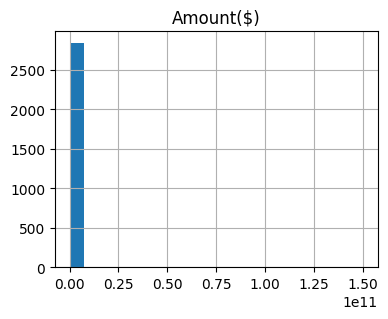

In [205]:
# We will start by plotting a histogram of the whole dataset to view the distrubution of the various numeric columns of the dataset

startup.hist(
    figsize=(15,15),
    layout=(4,3),
    bins=20
    );

plt.savefig("hist.png")

In [206]:
startup.describe(include= "all")

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
count,2846,2798,1926,2.846000e+03,2733,2846,2846
unique,2213,589,56,NaN,129,2687,4
top,BharatPe,FinTech,Seed,NaN,Bangalore,Provides online learning classes,2021
freq,10,173,692,NaN,858,5,1178
mean,NaN,NaN,NaN,7.560112e+07,NaN,NaN,NaN
std,NaN,NaN,NaN,2.815105e+09,NaN,NaN,NaN
min,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN
25%,NaN,NaN,NaN,2.000000e+05,NaN,NaN,NaN
50%,NaN,NaN,NaN,1.600000e+06,NaN,NaN,NaN
75%,NaN,NaN,NaN,8.000000e+06,NaN,NaN,NaN


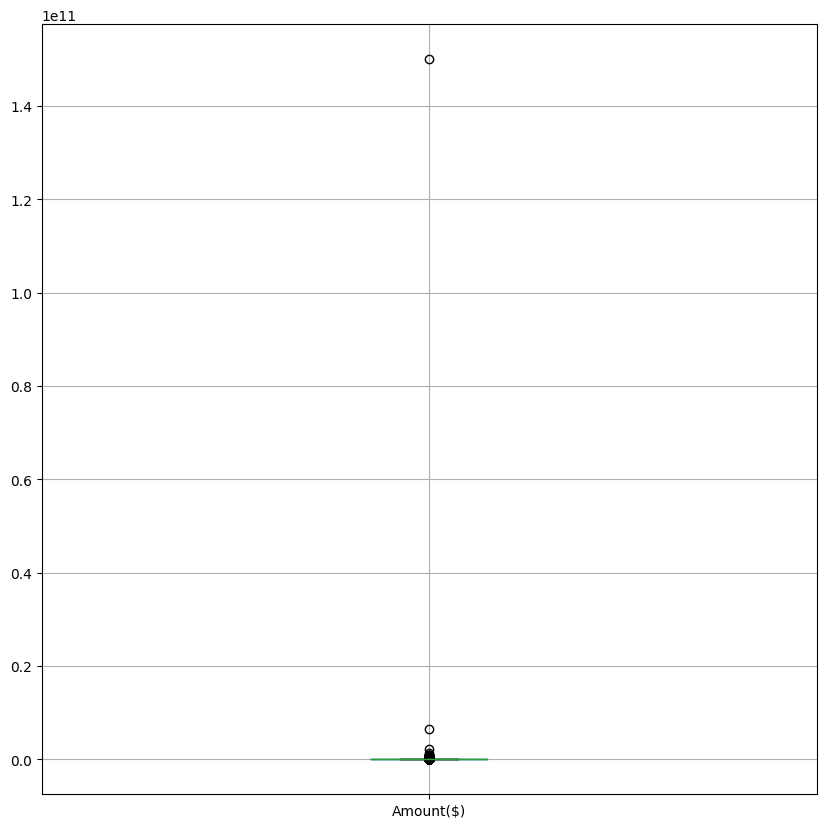

In [207]:
# Used a boxplot to show distributions of the numeric data values.
startup.boxplot(figsize= (10,10))

plt.savefig("box.png")

In [208]:
##We can see there is a really big outlier, we will investigate it to find out if its normal



In [209]:
startup.isna().sum()

Company/Brand      0
Sector            48
Stage            920
Amount($)          0
HeadQuarter      113
What it does       0
Year               0
dtype: int64

#### From our univariate analysis the following observation were made;
- Sector , Stage and HeadQuater coulmns had missing values.
- Due to the very high standard deviation recorded. The median value to fill in the missing values.

### Missing/NaN Values

### There are missing values in the following columns:

- HeadQuarters

- Sector

- Stage

Also, the amount column has lots of outliers

#### 1. Handling Missing Values In The Sector Column

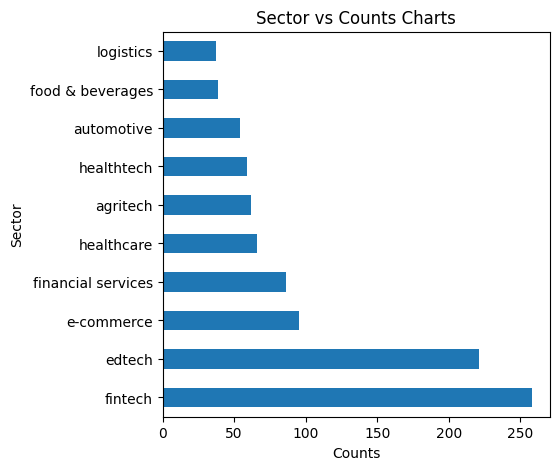

In [210]:
 
# To ensure consistency in the sector column all the names were converted to lowercase.
plt.title("Sector vs Counts Charts")
plt.xlabel("Counts")
plt.ylabel("Sector")
startup["Sector"]=startup["Sector"].str.lower()
startup["Sector"].value_counts().iloc[:10].plot.barh(figsize= (5,5));

plt.savefig("Sector.png")

##FinTech is the most occuring value

In [211]:
#fill missing values in Sector column with mode
#Missing values was filled with "fintech" which is recorded as the modal value 
startup['Sector'] = startup['Sector'].fillna("fintech")
startup['Sector']

0                                agriculture
1                                     credit
2                         financial services
3                       e-commerce platforms
4                       cloud infrastructure
5                                   internet
6                            market research
7                       information services
8                            mobile payments
9                                        b2b
10                                  internet
11                                      apps
12                             food delivery
13                     industrial automation
14                                automotive
15                                   finance
16                                accounting
17                   artificial intelligence
18                        internet of things
19                        air transportation
20                        financial services
21                         food and beverage
22        

In [212]:
startup["Sector"].isna().sum()

0

#### 2. handling Missing Values For The Stage Column

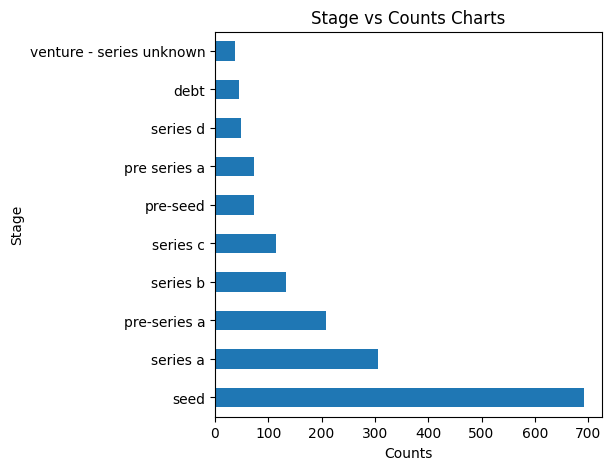

In [213]:
# 2.Stage

# To ensure consistency in the stage column all the names were converted to lowercase.
plt.title("Stage vs Counts Charts")
plt.xlabel("Counts")
plt.ylabel("Stage")
startup["Stage"]=startup["Stage"].str.lower()
startup["Stage"].value_counts().iloc[:10].plot.barh(figsize= (5,5));


In [214]:
#fill missing values in Sector column with mode
#Missing values was filled with "fintech" which is recorded as the modal value 
startup['Stage'] = startup['Stage'].fillna("seed")
startup['Stage']


0                           seed
1                       series a
2                          angel
3                           seed
4                           seed
5                           seed
6                          angel
7                           seed
8                           seed
9                           seed
10                          seed
11                          seed
12                          seed
13                          seed
14                          seed
15                          seed
16                          seed
17                          seed
18                          seed
19                      series a
20                          seed
21                          seed
22                          seed
23                          seed
24                      series a
25                          seed
26                          seed
27                          seed
28                         angel
29                          seed
30        

In [215]:
startup["Stage"].isna().sum()

0

#### Dealing with Missing Values In The HeadQuarter Column

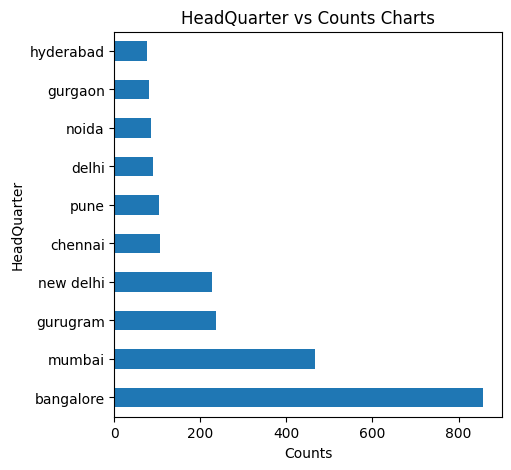

In [216]:
# 3.HeadQuarter
# To ensure consistency in the sector column all the names were converted to lowercase.

plt.title("HeadQuarter vs Counts Charts")
plt.xlabel("Counts")
plt.ylabel("HeadQuarter")
startup["HeadQuarter"]=startup["HeadQuarter"].str.lower()
startup["HeadQuarter"].value_counts().iloc[:10].plot.barh(figsize= (5,5));


For the HeadQuarter column, we will use the geolocator to find the missing rows, and for those we find their HeadQuarters, we will replace them with the mode. 

In [217]:
geolocator = Nominatim(user_agent="Seville_LP1_")

# loop over rows and fill in missing values for Location column
for index, row in startup.iterrows():
    if pd.isna(row['HeadQuarter']):
        # use geocoding service to find location based on company name
        HeadQuarter = geolocator.geocode(row['Company/Brand'])
        if HeadQuarter is not None:
            startup.at[index, 'HeadQuarter'] = HeadQuarter.address

# print the updated dataset
print(startup)


                                          Company/Brand  \
0                                       Happy Cow Dairy   
1                                            MyLoanCare   
2                                           PayMe India   
3                                              Eunimart   
4                                                Hasura   
5                                             Tripshelf   
6                                          Hyperdata.IO   
7                                          Freightwalla   
8                                    Microchip Payments   
9                            BizCrum Infotech Pvt. Ltd.   
10                                              Emojifi   
11                                                Flock   
12                                            Freshboxx   
13                           Wide Mobility Mechatronics   
14                                              Pitstop   
15                                               Mihuru 

In [218]:
##We will check to ensure that the geolocator gave us accurate values

startup["HeadQuarter"].unique()

array(['mumbai', 'gurgaon', 'noida', 'hyderabad', 'bengaluru', 'kalkaji',
       'bangalore', 'delhi', 'india', 'hubli', 'new delhi', 'chennai',
       'mohali', 'kolkata', 'pune', 'jodhpur', 'kanpur', 'ahmedabad',
       'azadpur', 'haryana', 'cochin', 'faridabad', 'jaipur', 'kota',
       'anand', 'bangalore city', 'belgaum', 'thane', 'margão', 'indore',
       'alwar', 'kannur', 'trivandrum', 'ernakulam', 'kormangala',
       'uttar pradesh', 'andheri', 'mylapore', 'ghaziabad', 'kochi',
       'powai', 'guntur', 'kalpakkam', 'bhopal', 'coimbatore', 'worli',
       'alleppey', 'chandigarh', 'guindy', 'lucknow',
       'Shaving Brush, Sant Savata Marg, Byculla East, E Ward, Zone 1, Mumbai, Mumbai City, Maharashtra, 400027, India',
       'telangana', nan,
       'Secret Trail Bamboo Stop, Lancaster - Open Canal Road, Navarro, Pasong Camachile I, General Trias, Cavite, Calabarzon, 4107, Philippines',
       "Byju's, Hosur Road, Adugodi, South Zone, Bengaluru, Bangalore South, Bangalore

##List of companies with discrapencies

##Daalchini, Shanti Nagar Main Road, Chromepet, Pallavaram, Chengalpattu District, Tamil Nadu, 600044, India'

       'Kalvárie znovu ožívá, 11271, Pišův mlýn, Nová Říše, okres Jihlava, Kraj Vysočina, Jihovýchod, 588 65, Česko'
    ,
       '玉鹿, 丽江市, 云南省, 中国', 'odisha'
        ,
       'Peppermint, Las Vegas, Clark County, Nevada, 89130, United States'
    ,
       'Jiffy, North Jefferson Way, Indianola, Warren County, Iowa, 50125, United States'
        ,
       'Postman, Rruga Vasil Tromara, Korçë, Bashkia Korçë, Qarku i Korçës, Shqipëria Jugore, 7001, Shqipëria',
    
       'Reaction Engines Limited, Road Y, Culham Science Centre, Clifton Hampden, South Oxfordshire, Oxfordshire, England, OX14 3DB, United Kingdom',
      
    'Vähäkatu, Tehdas, Hyvinkää, Helsingin seutukunta, Uusimaa, Etelä-Suomen aluehallintovirasto, Manner-Suomi, 05801, Suomi / Finland',
      
        'illumnus, Granta Park, Great Abington, South Cambridgeshire, Cambridgeshire, Cambridgeshire and Peterborough, England, CB21 6GQ, United Kingdom',
    
    
       'Scientific Research، Language and Pedagogy Center, شەقامی کەرکووک, گەڕەکی ڕاستی ٣٠١, ھەولێر, شارۆچکەی ناوەندی هەولێر, پارێزگای ھەولێر, هەرێمی کوردستان, 44001, العراق',
      
    'Sarva, Virrat, Ylä-Pirkanmaan seutukunta, Pirkanmaa, Länsi- ja Sisä-Suomen aluehallintovirasto, Manner-Suomi, Suomi / Finland'
    ,
      
        'Nyíri, Sátoraljaújhelyi járás, Borsod-Abaúj-Zemplén vármegye, Észak-Magyarország, Alföld és Észak, 3998, Magyarország',
       
    
       'Fond de Voie de Blive, Le Pavillon-Sainte-Julie, Troyes, Aube, Grand Est, France métropolitaine, 10350, France'
        ,
       'ອຸດົມ, ເມືອງຫ້ວຍຊາຍ, ບໍ່ແກ້ວ, ປະເທດລາວ',
    
       'Setu, Cipayung, Jakarta Timur, Daerah Khusus Ibukota Jakarta, Indonesia',
        
       'Amica, Corigliano-Rossano, Cosenza, Calabria, 87064, Italia',
    
       'Del Campo Delivery, El Portachuelo, Parroquia Unión, Municipio Iribarren, Lara, 3001, Venezuela',
        
       'Neeman, 226, Upper Richmond Road West, East Sheen, London Borough of Richmond upon Thames, London, Greater London, England, SW14 8AH, United Kingdom',
      
        
       'ESL Federal Credit Union, 3169, Chili Avenue, Chili Center, City of Rochester, Town of Chili, Monroe County, New York, 14624, United States',
    
       'Chaayos, Himalaya Marg, Sector 22, Ward 3, Chandigarh, 160021, India',
        
       'Altor, Norcen, Pedavena, Belluno, Veneto, 32034, Italia',
    
       'Byju Road, Kunnamkulam, Thrissur, Kerala, 680503, India',

##LogiNext Solutions, Gate No 2, Plant No. 6, Lal Bahadur Shastri Marg, Damodar Park, Vikhroli West, Mumbai, Mumbai Suburban, Maharashtra, 400079, India

##Park County, Colorado, United States

##Discrapencies from using the geolocator to find the locations:

##XpressBees Office, NH52, Kota, Ladpura Tehsil, Kota District, Rajasthan, 324001, India

##Шикша, «Залесье — Сорога — Ореховка — Дубровка» — Турская — Бородино, Заполек, Осташковский городской округ, Тверская область, Центральный федеральный округ, 172755, Россия

##Zomato, P-129, August Kranti Marg, Ardee City, Sector 44, Gurgaon, Gurugram, Haryana, 122002, India

##Queens Collection, Shop no. 22-23, Peace point Road, Varanasi, Sadar, Varanasi, Uttar Pradesh, 221010, India

##Pont Ar Rhéo, Plounérin, Lannion, Côtes-d'Armor, Bretagne, France métropolitaine, 22780, France

##Куб, Добрянский городской округ, Пермский край, Приволжский федеральный округ, Россия

##Captain Teach Road, Scorton Shores, Sandwich, Barnstable County, Massachusetts, 02763, United States

##կրիստալ, Արշակունյաց պողոտա, Կենտրոն, Երևան, 0023, Հայաստան

##Değirmenoluğu, Eleşkirt, Ağrı, Doğu Anadolu Bölgesi, Türkiye

##'Veterinaria Skylo, Eleuterio Ramírez, La Unión, Comuna de La Unión, Provincia de Ranco, Región de Los Ríos, 5220000, Chile

##

##

In [219]:
##We will find all these rows and deal with them

In [220]:
startup[startup["HeadQuarter"]== "Veterinaria Skylo, Eleuterio Ramírez, La Unión, Comuna de La Unión, Provincia de Ranco, Región de Los Ríos, 5220000, Chile"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1603,Skylo,iot,series b,103000000,"Veterinaria Skylo, Eleuterio Ramírez, La Unión...",Provides affordable and ever present network t...,2020


In [221]:
startup.loc[1603, "HeadQuarter"]= "Bengaluru" 

##Per the link attached, it is located in bengaluru, https://craft.co/skylo-technologies/locations

In [222]:
startup[startup["HeadQuarter"]=="Değirmenoluğu, Eleşkirt, Ağrı, Doğu Anadolu Bölgesi, Türkiye" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1607,Samya AI,saas,seed,6000000,"Değirmenoluğu, Eleşkirt, Ağrı, Doğu Anadolu Bö...",Revenue growth AI startup in the consumer pack...,2020


In [223]:
startup.loc[1607, "HeadQuarter"]= "Ağrı"

In [224]:
startup[startup["HeadQuarter"]== "կրիստալ, Արշակունյաց պողոտա, Կենտրոն, Երևան, 0023, Հայաստան"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1608,Kristal AI,ai,series a,6000000,"կրիստալ, Արշակունյաց պողոտա, Կենտրոն, Երևան, 0...",Provides Algorithm-based financial services,2020


In [225]:
startup.loc[1608, "HeadQuarter"]= "Bengaluru"

In [226]:
startup[startup["HeadQuarter"]== "Captain Teach Road, Scorton Shores, Sandwich, Barnstable County, Massachusetts, 02763, United States"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1615,Teach Us,edtech,seed,12700,"Captain Teach Road, Scorton Shores, Sandwich, ...",Educational portal which enables the students ...,2020


In [227]:
startup.loc[1615, "HeadQuarter"]= "Massachusetts"

In [228]:
startup[startup["HeadQuarter"]== "Куб, Добрянский городской округ, Пермский край, Приволжский федеральный округ, Россия"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1632,Klub,fintech,pre-seed,2000000,"Куб, Добрянский городской округ, Пермский край...",Provides growth financing to high-affinity brands,2020


In [229]:
startup.loc[1632, "HeadQuarter"]= "Singapore"

In [230]:
startup[startup["HeadQuarter"]=="Pont Ar Rhéo, Plounérin, Lannion, Côtes-d'Armor, Bretagne, France métropolitaine, 22780, France" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1638,Rheo,entertainment,seed,2000000,"Pont Ar Rhéo, Plounérin, Lannion, Côtes-d'Armo...",Online e-sports streaming and community platform,2020


In [231]:
startup.loc[1638, "HeadQuarter"]= "Bretagne"

In [232]:
startup[startup["HeadQuarter"]=="Queens Collection, Shop no. 22-23, Peace point Road, Varanasi, Sadar, Varanasi, Uttar Pradesh, 221010, India" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1645,Mamaearth,ecommerce,series a,18300000,"Queens Collection, Shop no. 22-23, Peace point...",Online baby and mother care brand,2020


In [233]:
startup.loc[1645, "HeadQuarter"]= " Varanasi"

In [234]:
startup[startup["HeadQuarter"]=="Zomato, P-129, August Kranti Marg, Ardee City, Sector 44, Gurgaon, Gurugram, Haryana, 122002, India" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1647,Zomato,foodtech,seed,150000000,"Zomato, P-129, August Kranti Marg, Ardee City,...",Online food delivery and restaurant discovery ...,2020


In [235]:
startup.loc[1647, "HeadQuarter"]= "Gurugram"

In [236]:
startup[startup["HeadQuarter"]== "Шикша, «Залесье — Сорога — Ореховка — Дубровка» — Турская — Бородино, Заполек, Осташковский городской округ, Тверская область, Центральный федеральный округ, 172755, Россия"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1654,Shiksha,edtech,seed,181000,"Шикша, «Залесье — Сорога — Ореховка — Дубровка...",It makes college selection easy for students l...,2020


In [237]:
startup.loc[1654, "HeadQuarter"]= "Noida"

In [238]:
startup[startup["HeadQuarter"]=="XpressBees Office, NH52, Kota, Ladpura Tehsil, Kota District, Rajasthan, 324001, India" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1658,XpressBees,logistics,seed,10000000,"XpressBees Office, NH52, Kota, Ladpura Tehsil,...",Provides end to end supply chain solutions,2020


In [239]:
startup.loc[1658, "HeadQuarter"]= "Kota"

In [240]:
startup[startup["HeadQuarter"]=="Park County, Colorado, United States" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1600,Park+,techonology,seed,11000000,"Park County, Colorado, United States",It is engaged in bringing digitization in parking,2020


In [241]:
startup.loc[1600, "HeadQuarter"]= "Gurugram" ##according to https://www.cbinsights.com/company/park-

In [242]:
startup[startup["HeadQuarter"]== "LogiNext Solutions, Gate No 2, Plant No. 6, Lal Bahadur Shastri Marg, Damodar Park, Vikhroli West, Mumbai, Mumbai Suburban, Maharashtra, 400079, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1595,LogiNext,transport automation,series b,39000000,"LogiNext Solutions, Gate No 2, Plant No. 6, La...",It helps logistics companies to improve intern...,2020


In [243]:
startup.loc[1595, "HeadQuarter"]= "Mumbai"

In [244]:
startup[startup["HeadQuarter"]== "Byju Road, Kunnamkulam, Thrissur, Kerala, 680503, India" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1548,Byju,edtech,seed,200000000,"Byju Road, Kunnamkulam, Thrissur, Kerala, 6805...",Provides online learning classes,2020
1648,Byju,edtech,seed,200000000,"Byju Road, Kunnamkulam, Thrissur, Kerala, 6805...",Provides online learning classes,2020


In [245]:
startup.loc[1548, "HeadQuarter"]= "Thrissur"
startup.loc[1648, "HeadQuarter"]= "Thrissur"

In [246]:
startup[startup["HeadQuarter"]=="Altor, Norcen, Pedavena, Belluno, Veneto, 32034, Italia" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1545,Altor,tech,seed,0,"Altor, Norcen, Pedavena, Belluno, Veneto, 3203...",Makes helmets that are IoT and AI enabled,2020


In [247]:
startup.loc[1545, "HeadQuarter"]= "Norcen"

In [248]:
startup[startup["HeadQuarter"]=="Chaayos, Himalaya Marg, Sector 22, Ward 3, Chandigarh, 160021, India" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year


In [249]:
startup.loc[1543, "HeadQuarter"]= "Chandigarh"

In [250]:
startup[startup["HeadQuarter"]=="ESL Federal Credit Union, 3169, Chili Avenue, Chili Center, City of Rochester, Town of Chili, Monroe County, New York, 14624, United States" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1536,Nova Credit,fintech,series b,50000000,"ESL Federal Credit Union, 3169, Chili Avenue, ...",Cross-border consumer credit startup,2020


In [251]:
startup.loc[1536, "HeadQuarter"]= "New York"

In [252]:
startup[startup["HeadQuarter"]== "Neeman, 226, Upper Richmond Road West, East Sheen, London Borough of Richmond upon Thames, London, Greater London, England, SW14 8AH, United Kingdom"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1483,Neeman,ecommerce,pre series a,1000000,"Neeman, 226, Upper Richmond Road West, East Sh...",An eco-conscious footwear brand making comfort...,2020


In [253]:
startup.loc[1483, "HeadQuarter"]= "London"

In [254]:
startup[startup["HeadQuarter"]== "Del Campo Delivery, El Portachuelo, Parroquia Unión, Municipio Iribarren, Lara, 3001, Venezuela"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1415,RaRa Delivery,logistics,seed,800000,"Del Campo Delivery, El Portachuelo, Parroquia ...",Provides same day delivery service for ecommer...,2020


In [255]:
startup.loc[1415, "HeadQuarter"]= "Jakarta"

In [256]:
startup[startup["HeadQuarter"]=="Amica, Corigliano-Rossano, Cosenza, Calabria, 87064, Italia" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year


In [257]:
startup.loc[1404, "HeadQuarter"]= "Cosenza"

In [258]:
startup[startup["HeadQuarter"]== "Setu, Cipayung, Jakarta Timur, Daerah Khusus Ibukota Jakarta, Indonesia"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1393,Setu,fintech,series a,14259000,"Setu, Cipayung, Jakarta Timur, Daerah Khusus I...",Offers open APIs across four categories: bills...,2020


In [259]:
startup.loc[1393, "HeadQuarter"]= "Jakarta"

In [260]:
startup[startup["HeadQuarter"]=="ອຸດົມ, ເມືອງຫ້ວຍຊາຍ, ບໍ່ແກ້ວ, ປະເທດລາວ" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1391,Toch,media tech,seed,400000,"ອຸດົມ, ເມືອງຫ້ວຍຊາຍ, ບໍ່ແກ້ວ, ປະເທດລາວ",AI based Video object detection and Tagging pl...,2020


In [261]:
startup.loc[1391, "HeadQuarter"]= "Mumbai"

In [262]:
startup[startup["HeadQuarter"]== "Fond de Voie de Blive, Le Pavillon-Sainte-Julie, Troyes, Aube, Grand Est, France métropolitaine, 10350, France"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1389,BLive,tourism & ev,pre series a,0,"Fond de Voie de Blive, Le Pavillon-Sainte-Juli...","It offers experiential, guided tours on smart ...",2020


In [263]:
startup.loc[1389, "HeadQuarter"]= "Troyes"

In [264]:
startup[startup["HeadQuarter"]== "Nyíri, Sátoraljaújhelyi járás, Borsod-Abaúj-Zemplén vármegye, Észak-Magyarország, Alföld és Észak, 3998, Magyarország"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1360,NIRA,fintech,pre series a,2100000,"Nyíri, Sátoraljaújhelyi járás, Borsod-Abaúj-Ze...",It offers access and credit to working Indians,2020


In [265]:
startup.loc[1360, "HeadQuarter"]= "Bengaluru"

In [266]:
startup[startup["HeadQuarter"]== "Sarva, Virrat, Ylä-Pirkanmaan seutukunta, Pirkanmaa, Länsi- ja Sisä-Suomen aluehallintovirasto, Manner-Suomi, Suomi / Finland"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1356,Sarva,yoga & wellness,seed,0,"Sarva, Virrat, Ylä-Pirkanmaan seutukunta, Pirk...",It drives a cultural change in making yoga-bas...,2020


In [267]:
startup.loc[1356, "HeadQuarter"]= "Mumbai" ##According to https://www.crunchbase.com/organization/sarva

In [268]:
startup[startup["HeadQuarter"]== "Scientific Research، Language and Pedagogy Center, شەقامی کەرکووک, گەڕەکی ڕاستی ٣٠١, ھەولێر, شارۆچکەی ناوەندی هەولێر, پارێزگای ھەولێر, هەرێمی کوردستان, 44001, العراق"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1350,Pedagogy,edtech,seed,400000,Scientific Research، Language and Pedagogy Cen...,It has a single subscription model that allows...,2020


In [269]:
startup.loc[1350, "HeadQuarter"]= "Ahmedabad"

In [270]:
startup[startup["HeadQuarter"]=="illumnus, Granta Park, Great Abington, South Cambridgeshire, Cambridgeshire, Cambridgeshire and Peterborough, England, CB21 6GQ, United Kingdom" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1307,Illumnus,edtech,seed,100000,"illumnus, Granta Park, Great Abington, South C...",Offers Collaborative learning management syste...,2020


In [271]:
startup.loc[1307, "HeadQuarter"]= "Pune" ##Accoding to https://www.crunchbase.com/organization/illumnus

In [272]:
startup[startup["HeadQuarter"]=="Vähäkatu, Tehdas, Hyvinkää, Helsingin seutukunta, Uusimaa, Etelä-Suomen aluehallintovirasto, Manner-Suomi, 05801, Suomi / Finland" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1281,Vahak,transport,seed,0,"Vähäkatu, Tehdas, Hyvinkää, Helsingin seutukun...",It enables logistic companies to conncet with ...,2020


In [273]:
startup.loc[1281, "HeadQuarter"]= "Helsinki"

In [274]:
startup[startup["HeadQuarter"]=="Reaction Engines Limited, Road Y, Culham Science Centre, Clifton Hampden, South Oxfordshire, Oxfordshire, England, OX14 3DB, United Kingdom" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1262,F5,retail aggregator,seed,0,"Reaction Engines Limited, Road Y, Culham Scien...",It provides opportunities for its partner vend...,2020


In [275]:
startup.loc[1262, "HeadQuarter"]= "Oxfordshire"

In [276]:
startup[startup["HeadQuarter"]=="Postman, Rruga Vasil Tromara, Korçë, Bashkia Korçë, Qarku i Korçës, Shqipëria Jugore, 7001, Shqipëria" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1261,Postman,tech,series c,150000000,"Postman, Rruga Vasil Tromara, Korçë, Bashkia K...",API development platform startup,2020


In [277]:
startup.loc[1261, "HeadQuarter"]= "Korçë"

In [278]:
startup[startup["HeadQuarter"]=="Jiffy, North Jefferson Way, Indianola, Warren County, Iowa, 50125, United States" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1260,Jiffy ai,ai,series a,18000000,"Jiffy, North Jefferson Way, Indianola, Warren ...",Enterprise automation startup,2020


In [279]:
startup.loc[1260, "HeadQuarter"]= "Indianola"

In [280]:
startup[startup["HeadQuarter"]=="Peppermint, Las Vegas, Clark County, Nevada, 89130, United States" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1248,Peppermint,robotics,seed,0,"Peppermint, Las Vegas, Clark County, Nevada, 8...",Industrial robotics startup,2020


In [281]:
startup.loc[1248, "HeadQuarter"]= "Mumbai" ##According to https://www.crunchbase.com/organization/peppermint-652a

In [282]:
startup[startup["HeadQuarter"]=="玉鹿, 丽江市, 云南省, 中国" ]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1239,Yulu,micro-mobiity,seed,3964000,"玉鹿, 丽江市, 云南省, 中国",The electric and scooter rental startup,2020


In [283]:
startup.loc[1239, "HeadQuarter"]= "Bengaluru" ##according to https://en.wikipedia.org/wiki/Yulu_(transportation_company)#:~:text=Yulu%20is%20a%20technology%2Ddriven,and%20headquartered%20in%20Bengaluru%2C%20India.

In [284]:
startup[startup["HeadQuarter"]== "Kalvárie znovu ožívá, 11271, Pišův mlýn, Nová Říše, okres Jihlava, Kraj Vysočina, Jihovýchod, 588 65, Česko"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1235,Oziva,nutrition,series a,5000000,"Kalvárie znovu ožívá, 11271, Pišův mlýn, Nová ...",Clean Label Active Nutrition Brand,2020


In [285]:
startup.loc[1235, "HeadQuarter"]= "Mumbai"

In [286]:
startup[startup["HeadQuarter"]=="Daalchini, Shanti Nagar Main Road, Chromepet, Pallavaram, Chengalpattu District, Tamil Nadu, 600044, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
1128,Daalchini,iot,pre series a,669000,"Daalchini, Shanti Nagar Main Road, Chromepet, ...",Physical and Digital vending machines startup,2020


In [287]:
startup.loc[1128, "HeadQuarter"]="Noida"

In [288]:
startup["HeadQuarter"].unique()

array(['mumbai', 'gurgaon', 'noida', 'hyderabad', 'bengaluru', 'kalkaji',
       'bangalore', 'delhi', 'india', 'hubli', 'new delhi', 'chennai',
       'mohali', 'kolkata', 'pune', 'jodhpur', 'kanpur', 'ahmedabad',
       'azadpur', 'haryana', 'cochin', 'faridabad', 'jaipur', 'kota',
       'anand', 'bangalore city', 'belgaum', 'thane', 'margão', 'indore',
       'alwar', 'kannur', 'trivandrum', 'ernakulam', 'kormangala',
       'uttar pradesh', 'andheri', 'mylapore', 'ghaziabad', 'kochi',
       'powai', 'guntur', 'kalpakkam', 'bhopal', 'coimbatore', 'worli',
       'alleppey', 'chandigarh', 'guindy', 'lucknow',
       'Shaving Brush, Sant Savata Marg, Byculla East, E Ward, Zone 1, Mumbai, Mumbai City, Maharashtra, 400027, India',
       'telangana', nan,
       'Secret Trail Bamboo Stop, Lancaster - Open Canal Road, Navarro, Pasong Camachile I, General Trias, Cavite, Calabarzon, 4107, Philippines',
       "Byju's, Hosur Road, Adugodi, South Zone, Bengaluru, Bangalore South, Bangalore

In [289]:
# ##There are still more discrapencies so we will deal with them:


# 'Shaving Brush, Sant Savata Marg, Byculla East, E Ward, Zone 1, Mumbai, Mumbai City, Maharashtra, 400027, India'
    
#     'Secret Trail Bamboo Stop, Lancaster - Open Canal Road, Navarro, Pasong Camachile I, General Trias, Cavite, Calabarzon, 4107, Philippines',
      
#     "Byju's, Hosur Road, Adugodi, South Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 560030, India"
#     ,
        
#         'Springboard, Benton County, Oregon, United States',
        
#        'Bijak, Bada Malhera Tahsil, Chhatarpur, Madhya Pradesh, India',
    
#        'Trume Lane, East Penn Township, Carbon County, Pennsylvania, 18122, United States',
        
#        'Rivigo, Hermosillo, Sonora, 83287, México',
    
#        'Ninjacart, 5th Main Road, Sector 6, HSR Layout Ward, Bommanahalli Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 380068, India',
 
    
#        'Phable, 19th Main Road, Agara, HSR Layout Ward, Bommanahalli Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 560034, India',
       
    
#        'Habitat, Avenue Raymond Dugrand, Port Marianne, Montpellier, Hérault, Occitanie, France métropolitaine, 34000, France',

In [290]:
startup[startup["HeadQuarter"]=="Shaving Brush, Sant Savata Marg, Byculla East, E Ward, Zone 1, Mumbai, Mumbai City, Maharashtra, 400027, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
525,Bombay Shaving,ecommerce,seed,6300000,"Shaving Brush, Sant Savata Marg, Byculla East,...",Provides a range of male grooming products,2019


In [291]:
startup.loc[525, "HeadQuarter"]= "Mumbai"

In [292]:
startup[startup["HeadQuarter"]=="Secret Trail Bamboo Stop, Lancaster - Open Canal Road, Navarro, Pasong Camachile I, General Trias, Cavite, Calabarzon, 4107, Philippines"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
539,Open Secret,food tech,seed,0,"Secret Trail Bamboo Stop, Lancaster - Open Can...",It produces and sells top quality snacks,2019


In [293]:
startup.loc[539, "HeadQuarter"]= "Cavite"

In [294]:
startup[startup["HeadQuarter"]=="Byju's, Hosur Road, Adugodi, South Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 560030, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
541,Byju's,edtech,seed,540000000,"Byju's, Hosur Road, Adugodi, South Zone, Benga...",Provides online learning classes,2019


In [295]:
startup.loc[541, "HeadQuarter"]= "Bengaluru"

In [296]:
startup[startup["HeadQuarter"]=="Springboard, Benton County, Oregon, United States"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
547,Springboard,edtech,post series a,11000000,"Springboard, Benton County, Oregon, United States",Offers online courses and extensive mentor-bas...,2019


In [297]:
startup.loc[547, "HeadQuarter"]= "Bengaluru"

In [298]:
startup[startup["HeadQuarter"]=="Bijak, Bada Malhera Tahsil, Chhatarpur, Madhya Pradesh, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
554,Bijak,agritech,seed,2500000,"Bijak, Bada Malhera Tahsil, Chhatarpur, Madhya...",B2B platform for agricultural commodities.,2019


In [299]:
startup.loc[554, "HeadQuarter"]= "Chhatarpur"

In [300]:
startup[startup["HeadQuarter"]=="Trume Lane, East Penn Township, Carbon County, Pennsylvania, 18122, United States"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
556,truMe,iot,seed,140000,"Trume Lane, East Penn Township, Carbon County,...",A global platform for Identity and Access Mana...,2019


In [301]:
startup.loc[556, "HeadQuarter"]= "Gurugram" ##according to https://www.ynos.in/startup/trume-313220

In [302]:
startup[startup["HeadQuarter"]=="Rivigo, Hermosillo, Sonora, 83287, México"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
559,Rivigo,logistics,series f,20000000,"Rivigo, Hermosillo, Sonora, 83287, México",It offers delivery services across India to re...,2019


In [303]:
startup.loc[559, "HeadQuarter"]= "Hermosillo"

In [304]:
startup[startup["HeadQuarter"]=="Ninjacart, 5th Main Road, Sector 6, HSR Layout Ward, Bommanahalli Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 380068, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
579,Ninjacart,b2b supply chain,seed,0,"Ninjacart, 5th Main Road, Sector 6, HSR Layout...",It connects producers of food directly to reta...,2019


In [305]:
startup.loc[579, "HeadQuarter"]= "Bengaluru"

In [306]:
startup[startup["HeadQuarter"]=="Phable, 19th Main Road, Agara, HSR Layout Ward, Bommanahalli Zone, Bengaluru, Bangalore South, Bangalore Urban, Karnataka, 560034, India"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
601,Phable,healthtech,seed,220000,"Phable, 19th Main Road, Agara, HSR Layout Ward...","It creates an engagement loop between doctors,...",2019
1327,Phable,healthtech,pre series a,1000000,"Phable, 19th Main Road, Agara, HSR Layout Ward...","It creates an engagement loop between doctors,...",2020


In [307]:
startup.loc[601, "HeadQuarter"]= "Bengaluru"
startup.loc[1327, "HeadQuarter"]= "Bengaluru"

In [308]:
startup[startup["HeadQuarter"]=="Habitat, Avenue Raymond Dugrand, Port Marianne, Montpellier, Hérault, Occitanie, France métropolitaine, 34000, France"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
700,Habitat,edtech,seed,600000,"Habitat, Avenue Raymond Dugrand, Port Marianne...","Habitat, a social learning edtech platform for...",2020


In [309]:
startup.loc[700, "HeadQuarter"]= "Montpellier"

In [310]:
startup["HeadQuarter"].unique()

array(['mumbai', 'gurgaon', 'noida', 'hyderabad', 'bengaluru', 'kalkaji',
       'bangalore', 'delhi', 'india', 'hubli', 'new delhi', 'chennai',
       'mohali', 'kolkata', 'pune', 'jodhpur', 'kanpur', 'ahmedabad',
       'azadpur', 'haryana', 'cochin', 'faridabad', 'jaipur', 'kota',
       'anand', 'bangalore city', 'belgaum', 'thane', 'margão', 'indore',
       'alwar', 'kannur', 'trivandrum', 'ernakulam', 'kormangala',
       'uttar pradesh', 'andheri', 'mylapore', 'ghaziabad', 'kochi',
       'powai', 'guntur', 'kalpakkam', 'bhopal', 'coimbatore', 'worli',
       'alleppey', 'chandigarh', 'guindy', 'lucknow', 'Mumbai',
       'telangana', nan, 'Cavite', 'Bengaluru', 'gurugram', 'Chhatarpur',
       'Gurugram', 'Hermosillo', 'waterloo', 'surat', 'rajasthan',
       'tirunelveli', 'Montpellier', 'singapore', 'gujarat', 'kerala',
       'frisco', 'california', 'dhingsara', 'new york', 'patna',
       'san francisco', 'san ramon', 'paris', 'plano', 'sydney',
       'san francisco bay a

##We will change all Bengalore, Banglore, Banglore City, Bangaluru to Bengaluru since Bangaluru is the official name. Source:https://www.britannica.com/place/Bangalore-India#:~:text=Bengaluru%2C%20also%20spelled%20Bengalooru%2C%20formerly,one%20of%20India's%20largest%20cities.

##We will also change all New Delhi to Delhi since Delhi is the city nme and New Delhi is a district, source: https://byjus.com/free-ias-prep/difference-between-delhi-and-new-delhi/#:~:text=Delhi%2C%20officially%20the%20National%20Capital,of%20the%20Government%20of%20India.

We will also deal with the following:

- India ## We will check for the row and repalce with the actual value
- Newcastle Upon Tyne## We will check for the company and make the necessary changes
- San Franciscao ## We will replace with the correct spelling: San Francisco
- Mountain View, CA ## We will replace with the city name: Mountain View, CA

In [311]:
startup["HeadQuarter"]= startup["HeadQuarter"].replace("bengalore", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("banglore", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("banglore city", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("bangaluru", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace(" bengaluru", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("bangalore", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("bangalore city", "Bengaluru")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("new delhi", "Delhi")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("san franciscao", "San Francisco")
startup["HeadQuarter"]= startup["HeadQuarter"].replace("mountain view, ca", "Mountain View")

In [312]:
startup[startup["HeadQuarter"]== "india"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
11,Flock,apps,seed,0,india,Flock is a real-time messaging and collaborati...,2018
41,UClean,clean energy,seed,584699,india,UClean is a tech enabled laundry service provi...,2018
58,Rooter,sports,seed,657786,india,Rooter is a mobile-based platform,2018
198,ZAMROO,internet,seed,0,india,Zamroo is a growing mobile marketplace that al...,2018


In [313]:
startup.loc[11, "HeadQuarter" ]= "Mumbai"

startup.loc[41, "HeadQuarter" ]= "Faridabad"

startup.loc[58, "HeadQuarter" ]= 'Delhi'

startup.loc[198, "HeadQuarter" ]= "Noida"

In [314]:
startup[startup["HeadQuarter"]== "newcastle upon tyne"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
914,Equiwatt,tech company,seed,300000,newcastle upon tyne,Equiwatt is a digital platform enabling househ...,2020


In [315]:
startup.loc[908, "HeadQuarter" ]= "Newcastle"

In [316]:
startup["HeadQuarter"].unique()

array(['mumbai', 'gurgaon', 'noida', 'hyderabad', 'bengaluru', 'kalkaji',
       'Bengaluru', 'delhi', 'Mumbai', 'hubli', 'Delhi', 'chennai',
       'mohali', 'kolkata', 'Faridabad', 'pune', 'jodhpur', 'kanpur',
       'ahmedabad', 'azadpur', 'haryana', 'cochin', 'faridabad', 'jaipur',
       'kota', 'anand', 'belgaum', 'thane', 'margão', 'indore', 'alwar',
       'kannur', 'trivandrum', 'ernakulam', 'Noida', 'kormangala',
       'uttar pradesh', 'andheri', 'mylapore', 'ghaziabad', 'kochi',
       'powai', 'guntur', 'kalpakkam', 'bhopal', 'coimbatore', 'worli',
       'alleppey', 'chandigarh', 'guindy', 'lucknow', 'telangana', nan,
       'Cavite', 'gurugram', 'Chhatarpur', 'Gurugram', 'Hermosillo',
       'waterloo', 'surat', 'rajasthan', 'tirunelveli', 'Montpellier',
       'singapore', 'gujarat', 'kerala', 'frisco', 'california',
       'dhingsara', 'new york', 'patna', 'san francisco', 'san ramon',
       'paris', 'plano', 'sydney', 'san francisco bay area', 'bangaldesh',
       'l

In [317]:
##we will now convert the location column to upper

startup["HeadQuarter"]= startup["HeadQuarter"].str.capitalize()

In [318]:
##We will check for the remaining missing columns 
startup["HeadQuarter"].isna().sum()

66

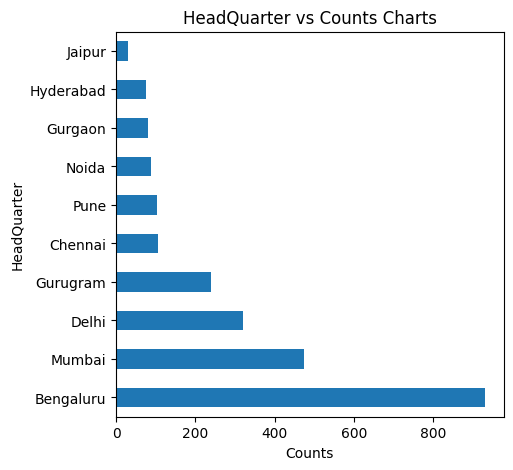

In [319]:
##We will check for the mode and replace the missing values with it

plt.title("HeadQuarter vs Counts Charts")
plt.xlabel("Counts")
plt.ylabel("HeadQuarter")
startup["HeadQuarter"]=startup["HeadQuarter"]
startup["HeadQuarter"].value_counts().iloc[:10].plot.barh(figsize= (5,5));

In [320]:

startup["HeadQuarter"] = startup["HeadQuarter"].fillna("Bengaluru")
startup["HeadQuarter"]

0                                                  Mumbai
1                                                 Gurgaon
2                                                   Noida
3                                               Hyderabad
4                                               Bengaluru
5                                                 Kalkaji
6                                               Hyderabad
7                                                  Mumbai
8                                               Bengaluru
9                                                   Delhi
10                                              Bengaluru
11                                                 Mumbai
12                                                  Hubli
13                                              Bengaluru
14                                              Bengaluru
15                                                 Mumbai
16                                              Bengaluru
17            

In [321]:
startup.HeadQuarter.isna().sum()

0

### Having A Final View Of Our Dataset

In [322]:
startup.head()

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year
0,Happy Cow Dairy,agriculture,seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018
1,MyLoanCare,credit,series a,950135,Gurgaon,Leading Online Loans Marketplace in India,2018
2,PayMe India,financial services,angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018
3,Eunimart,e-commerce platforms,seed,0,Hyderabad,Eunimart is a one stop solution for merchants ...,2018
4,Hasura,cloud infrastructure,seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018


In [323]:
###Amount column

##Some row in the Amount column were replaced with 0, and for those rows, we will replace them with the median investment 

startup["Amount($)"]= startup["Amount($)"].replace(0,  1600000.0)

In [324]:
startup["Amount($)"]

0             584699
1             950135
2            2000000
3            1600000
4            1600000
5             233879
6             730873
7            1600000
8            1600000
9            1600000
10           1600000
11           1600000
12           1600000
13           1600000
14           1461747
15            150000
16           1100000
17           1600000
18              7309
19           6000000
20            650000
21            511611
22            935518
23           1600000
24           1600000
25           2000000
26           2000000
27           2000000
28           1600000
29            292349
30           1000000
31           1600000
32            650000
33           1000000
34           5000000
35           4000000
36            438524
37           1000000
38           2800000
39           1600000
40            150000
41            584699
42           1000000
43           1700000
44           1600000
45           1300000
46           2000000
47           

### Getting Country Names

We realized that some of the companies added had their headquarters outside India; therefore, it will be a good idea to get the country of each column to help us focus our analysis on companies in India. For this we will use the Geolocator again. 

In [327]:
##I am commenting the code out since it takes so much time to run. You can try it on your own. Also, I have already saved the 
##dataframe from the geolocator below, and I have added it to github repository 

"""
startup["Country"]= None
geolocator = Nominatim(user_agent='startup')

# Iterating over rows and getting the country for each city
for i, row in startup.iterrows():
    location = geolocator.geocode(row['HeadQuarter'])
    if location:
        startup.at[i, 'Country'] = location.raw['display_name'].split(',')[-1].strip()
    else:
        startup.at[i, 'Country'] = None """

"\ngeolocator = Nominatim(user_agent='startup')\n\n# Iterating over rows and getting the country for each city\nfor i, row in startup.iterrows():\n    location = geolocator.geocode(row['HeadQuarter'])\n    if location:\n        startup.at[i, 'Country'] = location.raw['display_name'].split(',')[-1].strip()\n    else:\n        startup.at[i, 'Country'] = None "

In [328]:
##saving the file above 
#startup.to_csv("Desktop/startup_2.csv")

In [329]:
##I am reloading the datasetwe go from the geolocator

startup_2= pd.read_csv("Desktop/startup_2.csv")

In [330]:
startup_2

,Unnamed: 0,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Country
0,0,Happy Cow Dairy,agriculture,seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018,India
1,1,MyLoanCare,credit,series a,950135,Gurgaon,Leading Online Loans Marketplace in India,2018,India
2,2,PayMe India,financial services,angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,India
3,3,Eunimart,e-commerce platforms,seed,1600000,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,India
4,4,Hasura,cloud infrastructure,seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018,India
5,5,Tripshelf,internet,seed,233879,Kalkaji,Tripshelf is an online market place for holida...,2018,India
6,6,Hyperdata.IO,market research,angel,730873,Hyderabad,Hyperdata combines advanced machine learning w...,2018,India
7,7,Freightwalla,information services,seed,1600000,Mumbai,Freightwalla is an international forwarder tha...,2018,India
8,8,Microchip Payments,mobile payments,seed,1600000,Bengaluru,Microchip payments is a mobile-based payment a...,2018,India
9,9,BizCrum Infotech Pvt. Ltd.,b2b,seed,1600000,Delhi,Building Transactionary B2B Marketplaces,2018,India


In [331]:
startup_2= startup_2.drop("Unnamed: 0", axis= 1)

In [332]:
startup_2

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Country
0,Happy Cow Dairy,agriculture,seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018,India
1,MyLoanCare,credit,series a,950135,Gurgaon,Leading Online Loans Marketplace in India,2018,India
2,PayMe India,financial services,angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,India
3,Eunimart,e-commerce platforms,seed,1600000,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,India
4,Hasura,cloud infrastructure,seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018,India
5,Tripshelf,internet,seed,233879,Kalkaji,Tripshelf is an online market place for holida...,2018,India
6,Hyperdata.IO,market research,angel,730873,Hyderabad,Hyperdata combines advanced machine learning w...,2018,India
7,Freightwalla,information services,seed,1600000,Mumbai,Freightwalla is an international forwarder tha...,2018,India
8,Microchip Payments,mobile payments,seed,1600000,Bengaluru,Microchip payments is a mobile-based payment a...,2018,India
9,BizCrum Infotech Pvt. Ltd.,b2b,seed,1600000,Delhi,Building Transactionary B2B Marketplaces,2018,India


#### Let's check for missing values 



In [333]:
startup_2.isna().sum()

Company/Brand    0
Sector           0
Stage            0
Amount($)        0
HeadQuarter      0
What it does     0
Year             0
Country          6
dtype: int64

In [334]:
##We will fill them with india

startup_2["Country"]= startup_2["Country"].fillna(value= "India")

In [335]:
startup_2.isna().sum()

Company/Brand    0
Sector           0
Stage            0
Amount($)        0
HeadQuarter      0
What it does     0
Year             0
Country          0
dtype: int64

In [336]:
##since there are no empty values, we will proceed

In [384]:
startup_2.HeadQuarter.unique()

array(['Mumbai', 'Gurgaon', 'Noida', 'Hyderabad', 'Bengaluru', 'Kalkaji',
       'Delhi', 'Hubli', 'Chennai', 'Mohali', 'Kolkata', 'Faridabad',
       'Pune', 'Jodhpur', 'Kanpur', 'Ahmedabad', 'Azadpur', 'Haryana',
       'Cochin', 'Jaipur', 'Kota', 'Anand', 'Belgaum', 'Thane', 'Margão',
       'Indore', 'Alwar', 'Kannur', 'Trivandrum', 'Ernakulam',
       'Kormangala', 'Uttar pradesh', 'Andheri', 'Mylapore', 'Ghaziabad',
       'Kochi', 'Powai', 'Guntur', 'Kalpakkam', 'Bhopal', 'Coimbatore',
       'Worli', 'Alleppey', 'Chandigarh', 'Guindy', 'Lucknow',
       'Telangana', 'Cavite', 'Gurugram', 'Chhatarpur', 'Hermosillo',
       'Waterloo', 'Surat', 'Rajasthan', 'Tirunelveli', 'Montpellier',
       'Singapore', 'Gujarat', 'Kerala', 'Frisco', 'California',
       'Dhingsara', 'New york', 'Patna', 'San francisco', 'San ramon',
       'Paris', 'Plano', 'Sydney', 'San francisco bay area', 'Bangaldesh',
       'London', 'Milano', 'Palmwoods', 'France', 'Samastipur', 'Irvine',
       'Tumku

#### Filtering out only companies in India

In [337]:
##creating a variable for only startups in India

startup_2= startup_2[startup_2["Country"]=="India"]

In [338]:
startup_ind

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Country
0,Happy Cow Dairy,agriculture,seed,584699,Mumbai,A startup which aggregates milk from dairy far...,2018,India
1,MyLoanCare,credit,series a,950135,Gurgaon,Leading Online Loans Marketplace in India,2018,India
2,PayMe India,financial services,angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,India
3,Eunimart,e-commerce platforms,seed,1600000,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,India
4,Hasura,cloud infrastructure,seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018,India
5,Tripshelf,internet,seed,233879,Kalkaji,Tripshelf is an online market place for holida...,2018,India
6,Hyperdata.IO,market research,angel,730873,Hyderabad,Hyperdata combines advanced machine learning w...,2018,India
7,Freightwalla,information services,seed,1600000,Mumbai,Freightwalla is an international forwarder tha...,2018,India
8,Microchip Payments,mobile payments,seed,1600000,Bengaluru,Microchip payments is a mobile-based payment a...,2018,India
9,BizCrum Infotech Pvt. Ltd.,b2b,seed,1600000,Delhi,Building Transactionary B2B Marketplaces,2018,India


##Going through the HeadQuarter column, I noyced some of the headquarters where of the same location but of different variations; therefore we will try and deal with that below

In [339]:
startup_ind.HeadQuarter.unique()

array(['Mumbai', 'Gurgaon', 'Noida', 'Hyderabad', 'Bengaluru', 'Kalkaji',
       'Delhi', 'Hubli', 'Chennai', 'Mohali', 'Kolkata', 'Faridabad',
       'Pune', 'Jodhpur', 'Kanpur', 'Ahmedabad', 'Azadpur', 'Haryana',
       'Cochin', 'Jaipur', 'Kota', 'Anand', 'Belgaum', 'Thane', 'Margão',
       'Indore', 'Alwar', 'Kannur', 'Trivandrum', 'Ernakulam',
       'Kormangala', 'Uttar pradesh', 'Andheri', 'Mylapore', 'Ghaziabad',
       'Kochi', 'Powai', 'Guntur', 'Kalpakkam', 'Bhopal', 'Coimbatore',
       'Worli', 'Alleppey', 'Chandigarh', 'Guindy', 'Lucknow',
       'Telangana', 'Gurugram', 'Chhatarpur', 'Rajasthan', 'Tirunelveli',
       'Gujarat', 'Kerala', 'Dhingsara', 'Patna', 'Samastipur', 'Tumkur',
       'Rajastan', 'Ludhiana', 'Dehradun', 'Warangal', 'Hyderebad',
       'Odisha', 'Bihar', 'Goa', 'Tamil nadu', 'Thrissur', ' varanasi',
       'Ahmadabad', 'Small towns, andhra pradesh', 'Rajsamand', 'Ranchi',
       'Faridabad, haryana', 'Vadodara', 'Nagpur', 'West bengal',
       'Sam

Below are a list of cities in India with a variations in their spellings. We will replace each with the official city name to ensure consistent and  more accurate analysis. 

- Gurgoan== Gurugram 

- Kalkaji== Delhi 

- Hubli= Huballi 
- Azadpur== Delhi 

- Cochin == Kochi

- Belgaum is the same as Belagavi 

- Thiruvananthapuram== Trivandrum 

- Kormangala is under bengaluru 

- uttar pradesh is a state 

- Mylapore== Chennai 

- Powai == Mumbai 

- Kalpakkam== Chennai

- Worli== Mumbai 

- Guindy= Chennai 


- tumkur== Tumakuru, 

- Faridabad, haryana ==faridabad, 

- Mangalore==Mangaluru, 

- Powai== Mumbai

In [340]:
##replacing unofficial names with thier official names 

In [341]:
startup_ind["HeadQuarter"].replace("Powai", "Mumbai", inplace= True)
startup_ind["HeadQuarter"].replace("Mangalore", "Mangaluru", inplace= True)
startup_ind["HeadQuarter"].replace("Faridabad, haryana", "Faridabad", inplace= True)
startup_ind["HeadQuarter"].replace(' varanasi', "Varanasi", inplace= True)
startup_ind["HeadQuarter"].replace("Guindy", "Chennai ", inplace= True)
startup_ind["HeadQuarter"].replace("Worli", "Mumbai ", inplace= True)
startup_ind["HeadQuarter"].replace("Kalpakkam", "Chennai", inplace= True)
startup_ind["HeadQuarter"].replace("Mylapore", "Chennai", inplace= True)
startup_ind["HeadQuarter"].replace("Kormangala", "Bengaluru", inplace= True)
startup_ind["HeadQuarter"].replace("Trivandrum", "Thiruvananthapuram", inplace= True)
startup_ind["HeadQuarter"].replace("Belgaum", "Belagavi", inplace= True)
startup_ind["HeadQuarter"].replace("Cochin", "Kochi", inplace= True)
startup_ind["HeadQuarter"].replace("Azadpur", "Delhi", inplace= True)
startup_ind["HeadQuarter"].replace("Hubli", "Huballi", inplace= True)
startup_ind["HeadQuarter"].replace("Kalkaji", "Delhi", inplace= True)
startup_ind["HeadQuarter"].replace("Gurgoan", "Gurugram", inplace= True)

In [342]:
##doubling checking to ensure the replacement has taken effect 

startup_ind["HeadQuarter"].unique()

array(['Mumbai', 'Gurgaon', 'Noida', 'Hyderabad', 'Bengaluru', 'Delhi',
       'Huballi', 'Chennai', 'Mohali', 'Kolkata', 'Faridabad', 'Pune',
       'Jodhpur', 'Kanpur', 'Ahmedabad', 'Haryana', 'Kochi', 'Jaipur',
       'Kota', 'Anand', 'Belagavi', 'Thane', 'Margão', 'Indore', 'Alwar',
       'Kannur', 'Thiruvananthapuram', 'Ernakulam', 'Uttar pradesh',
       'Andheri', 'Ghaziabad', 'Guntur', 'Bhopal', 'Coimbatore',
       'Mumbai ', 'Alleppey', 'Chandigarh', 'Chennai ', 'Lucknow',
       'Telangana', 'Gurugram', 'Chhatarpur', 'Rajasthan', 'Tirunelveli',
       'Gujarat', 'Kerala', 'Dhingsara', 'Patna', 'Samastipur', 'Tumkur',
       'Rajastan', 'Ludhiana', 'Dehradun', 'Warangal', 'Hyderebad',
       'Odisha', 'Bihar', 'Goa', 'Tamil nadu', 'Thrissur', 'Varanasi',
       'Ahmadabad', 'Small towns, andhra pradesh', 'Rajsamand', 'Ranchi',
       'Vadodara', 'Nagpur', 'West bengal', 'Samsitpur', 'Silvassa',
       'Roorkee', 'Ambernath', 'Panchkula', 'Mangaluru', 'Telugana',
       'Bhub

In [347]:
##We are done with our univarite, we will now proceed to our bivariate where we answer our questions

In [383]:
startup_ind.to_csv("Desktop/startup_ind.csv")

### Note

We will be using the "startup_ind" dataframe for our analysis. 

## Bivariate Analysis: Answering the questions

### Note:

- From our univariate, there were outliers, so for calculations where we will be looking at averages, we will be using the median instead of the mean

# Question 1:

Are start-ups located in specific areas more likely to succeed or to receive more financing than those located other areas?

In [350]:
startup_ind["Stage"]= startup_ind["Stage"].apply(lambda x:str(x))
startup_ind["Amount($)"]= pd.to_numeric(startup_ind["Amount($)"].astype("int64"))

In [351]:
df_q1 = startup_ind[['HeadQuarter','Amount($)']]
df_q1["Amount($)"]= pd.to_numeric(df_q1["Amount($)"].astype("int64"))

In [352]:
df_q1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2773 entries, 0 to 2845
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   HeadQuarter  2773 non-null   object
 1   Amount($)    2773 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 65.0+ KB


In [353]:
df_q1= df_q1.groupby('HeadQuarter')['Amount($)'].sum().reset_index()

In [354]:
# df_q1.()
df_q1_sorted_top15 = df_q1.sort_values(['Amount($)'],ascending=False)[:15]

In [355]:
# df_q1.to_csv("Q1_Means_of_fundings_per_city.csv")

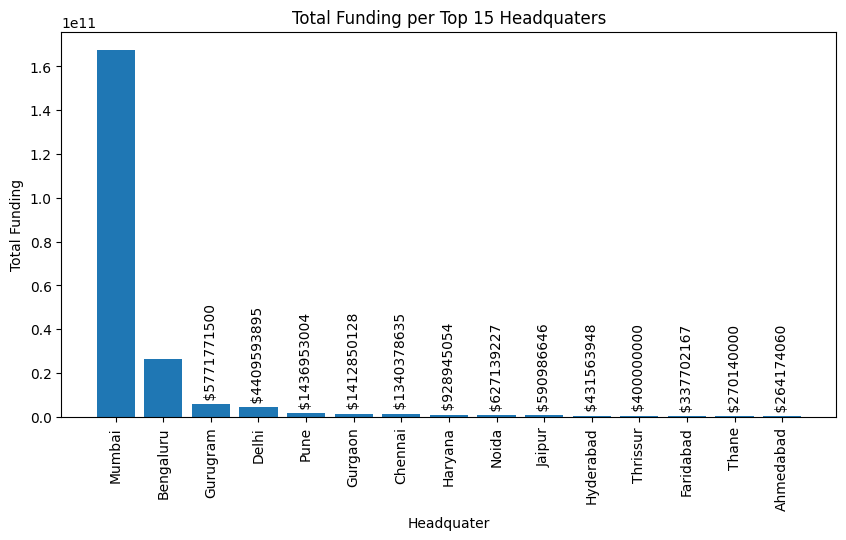

<Figure size 640x480 with 0 Axes>

In [356]:
plt.figure(figsize= (10,5))
rects1 = plt.bar(df_q1_sorted_top15['HeadQuarter'], df_q1_sorted_top15['Amount($)'])
# plt.ylim(0,615900000)

bar_ax1 = plt.gca()
for rectangle, size_ in zip(rects1,df_q1_sorted_top15['Amount($)'].to_list()):
    if rectangle==rects1[0] or rectangle==rects1[1]: #check if this is first or second bar
        height_ = rectangle.get_height()*0.4
    else:
        height_ = rectangle.get_height()
        bar_ax1.text(rectangle.get_x() + rectangle.get_width()/2.0,height_,
                 " $"+str(size_),ha='center', va='bottom', ma='left',rotation=90)
    
    
plt.title('Total Funding per Top 15 Headquaters')
plt.xlabel('Headquater')
plt.ylabel('Total Funding')
plt.xticks(rotation=90)
plt.show()
plt.draw()

plt.tight_layout()

plt.savefig("qq1.5.png")


### Summary for question 1:

- Startups in Mumbai had the highest amount of investment, followed by Bengaluru, Gurugram and Delhi. Therefore startups in Mumbai are more likely to get funding 


# Question 2

Has the amount of investments in the ecosystem increased over the 4 year span (the datasets we are looking at), or has it decreased?


To answer this question, we calculated the sum of funding amounts
over the four year period and plot a line plot of it

In [357]:
df_q2 = startup_ind[['Year','Amount($)']]
df_q2["Amount($)"]= pd.to_numeric(df_q2["Amount($)"].astype("int64"))
df_q2["Year"]= pd.to_numeric(df_q2["Year"].astype("int64"))

df_q2_grouped = df_q2.groupby('Year').agg({"Amount($)": "sum"}).reset_index()

In [358]:
df_q2_grouped

,Year,Amount($)
0,2018,6879808045
1,2019,3327533200
2,2020,23049376246
3,2021,179394426000


In [359]:
# df_q2.to_csv("Q2_total_funding_amount_per_year.csv")

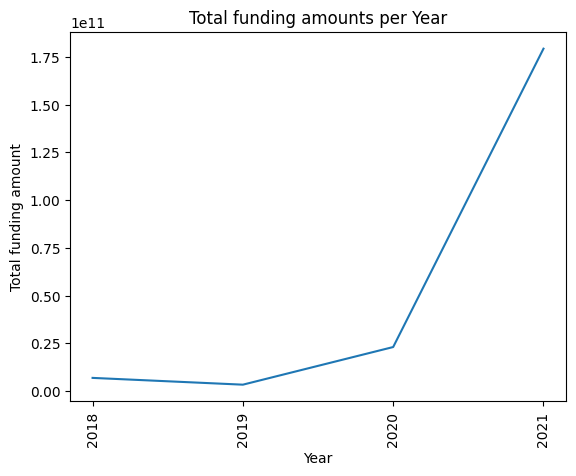

In [360]:
plt.plot(df_q2_grouped['Year'], df_q2_grouped['Amount($)'])
plt.title('Total funding amounts per Year')
plt.xlabel('Year')
plt.ylabel('Total funding amount')
plt.xticks(list(range(int(df_q2_grouped['Year'].min()), int(df_q2_grouped['Year'].max())+1)), rotation=90)
plt.show()


### Summary For Question 2:

- We can see that the funding in 2019 dropped from 2018, and this is because of the pandemic. 
- Also, there was a slight increase in funding in 2020 and an exponential increase from 2020 to 2021. 

# Question 3: What is the average investment amount received by Indian startups at different stages of their growth?

To answer this question, we group all the funding by the stage column and find the mean of each group

In [361]:
df_q3 =startup_ind[['Stage','Amount($)']]
df_q3["Amount($)"] = pd.to_numeric(df_q3["Amount($)"].astype("int64"))
df_q3 = df_q3.groupby('Stage')['Amount($)'].median().reset_index()
df_q3_sorted_top15 = df_q3.sort_values(['Amount($)'],ascending=True)[-5:]
df_q3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Stage      53 non-null     object 
 1   Amount($)  53 non-null     float64
dtypes: float64(1), object(1)
memory usage: 976.0+ bytes


In [362]:
df_q3_sorted_top15.head()

,Stage,Amount($)
12,pe,100000000.0
46,series f,175000000.0
15,post-ipo equity,185000000.0
49,series g,266000000.0
50,series h,635000000.0


In [363]:
# df_q2.to_csv("Q3_median_funding_amount_per_stage.csv")

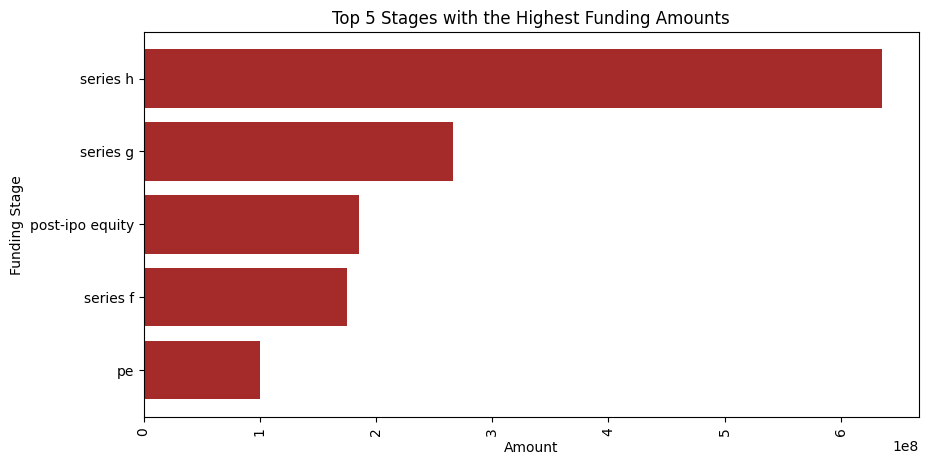

In [364]:
plt.figure(figsize= (10,5))
plt.barh(df_q3_sorted_top15['Stage'], df_q3_sorted_top15['Amount($)'], color='brown')
plt.title('Top 5 Stages with the Highest Funding Amounts')
plt.xlabel('Amount')
plt.ylabel('Funding Stage')
plt.xticks(rotation=90)
plt.show()

#### Summary of Question 3

On average, investors tend to invest more in companies in series H funding round than other funding stages

# Question 4

Does the nature of the industry has any impact on the amount of funding received?

To answer this question, we group the funding amount based on the sector column
and then we sum up the amounts of each group and visualize it with a bar plot

In [365]:
df_q4 = startup_ind[['Sector','Amount($)']]
df_q4["Sector"]= df_q4["Sector"].apply(lambda x:str(x).lower())
df_q4["Amount($)"] = pd.to_numeric(df_q4["Amount($)"].astype("int64"))
df_q4 = df_q4.groupby('Sector')['Amount($)'].sum().reset_index()
df_q4_sorted_top10 = df_q4.sort_values(['Amount($)'],ascending=True)[-10:]
df_q4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 542 entries, 0 to 541
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Sector     542 non-null    object
 1   Amount($)  542 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 8.6+ KB


In [366]:
# df_q4.to_csv("Q4_top_ten_total_funding_per_sector.csv")

In [367]:
df_q4_sorted_top10

,Sector,Amount($)
324,insurance,1098525000
306,hospitality,1738773839
250,financial services,2091141601
396,multinational conglomerate company,2200000000
51,automotive,2268193177
265,food delivery,2674677048
197,e-commerce,3098650579
208,edtech,5953918844
448,retail,6937880000
251,fintech,155020148186


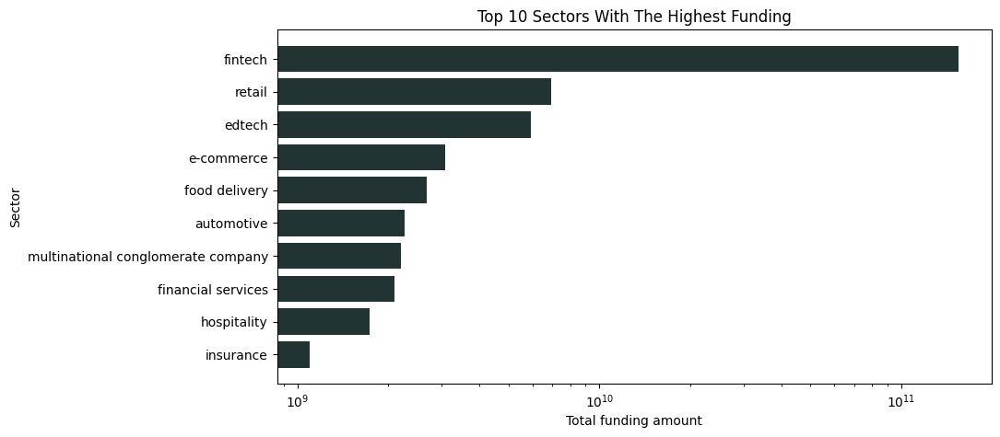

In [368]:
plt.figure(figsize= (10,5))
plt.barh(df_q4_sorted_top10['Sector'], df_q4_sorted_top10['Amount($)'], color='#233')
# plt.pie(df_q4_sorted_top10['Amount($)'].tolist(), labels=df_q4_sorted_top10['Sector'].tolist(), autopct='%1.1f%%')
plt.title('Top 10 Sectors With The Highest Funding')
plt.xlabel('Total funding amount')
plt.ylabel('Sector')
plt.xscale('log') #Using log scale in order to fit all bars in view
# plt.xticks(rotation=90)
plt.show()

We can see that companies in the fintech space tend to recieve more funding

# Question 5

Which startup (s) had the highest rate/count of funding (this counts the startup that occured most but not with duplicate funding)

To answer this question we count the number of occurence of each company name and visualize it

In [369]:
df_q5 = startup_ind[['Company/Brand','Amount($)']]
df_q5 = df_q5.groupby('Company/Brand').count().reset_index().rename(columns={'Amount($)':'Funding count'})
df_q5_sorted_top10 = df_q5.sort_values(['Funding count'],ascending=False)[:10]
df_q5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2153 entries, 0 to 2152
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  2153 non-null   object
 1   Funding count  2153 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 33.8+ KB


In [370]:
df_q5_sorted_top10.tail(10)

,Company/Brand,Funding count
185,BharatPe,10
1282,Nykaa,7
2094,Zomato,7
2083,Zetwerk,6
1942,Vedantu,6
1857,Trell,6
1698,Spinny,6
1100,MPL,6
701,Furlenco,5
1665,Slice,5


In [371]:
# df_q5_sorted_top10.to_csv("Q5_top_ten_total_funding_COUNT_per_company.csv")

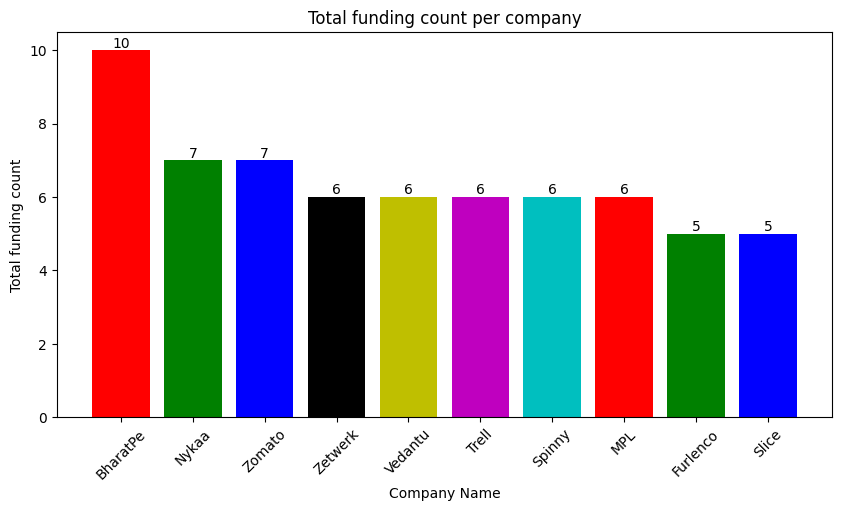

In [372]:
plt.figure(figsize= (10,5))

rects = plt.bar(df_q5_sorted_top10['Company/Brand'], df_q5_sorted_top10['Funding count'], color=list('rgbkymc'))
bar_ax1 = plt.gca()
for rectangle, size_ in zip(rects,df_q5_sorted_top10['Funding count'].to_list()):
    height_ = rectangle.get_height()
    bar_ax1.text(rectangle.get_x() + rectangle.get_width()/2.0,height_,
                 str(size_),ha='center', va='bottom', ma='left')

plt.title('Total funding count per company')
plt.xlabel('Company Name')
plt.ylabel('Total funding count')
plt.xticks(rotation=45)
bar_ax1 = plt.gca()
plt.show()

From the plot above, it can be seen that just within 4 years BharatePe company was able to secure 10 funding instances, making it the the highest amongst the companies which received multiple fundings. BaharatePe is a company in the fintech sector with its headquators located in Delhi	. They specialize in digital payment using QR codes, this might partly indicate how successful

### Q6. What Are the Top 5 Non-India Companies In The Indian Startup Market



In [373]:
startup_non_ind= startup_2[startup_2["Country"]!= "India"]

In [374]:
Top_5= startup_non_ind.groupby("Country").agg({"Amount($)": "sum"}).sort_values(by= "Amount($)", ascending= False).iloc[:5].reset_index()

In [375]:
Top_5

,Country,Amount($)
0,United States,1751612700
1,中国,776000000
2,United Kingdom,225100000
3,Deutschland,170000000
4,España,150000000


In [376]:
##Let's rename some of the rows:

Top_5.loc[1, 'Country']= 'China'
Top_5.loc[3, 'Country']= "Germany"
Top_5.loc[4, 'Country']= "Spain"



In [377]:
Top_5

,Country,Amount($)
0,United States,1751612700
1,China,776000000
2,United Kingdom,225100000
3,Germany,170000000
4,Spain,150000000


Text(0, 0.5, 'Country')

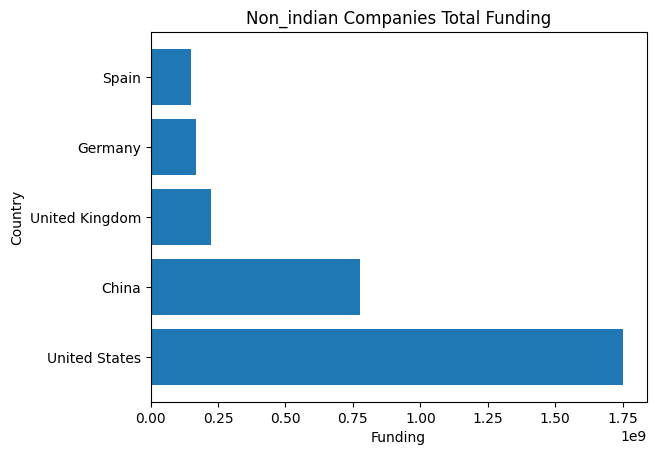

In [378]:
plt.barh(Top_5["Country"], Top_5["Amount($)"])
plt.title("Non_indian Companies Total Funding")
plt.xlabel("Funding")
plt.ylabel("Country")

- For non-India companies comapnies from the USA with presence in India had the highest funding, follwoing by companies from China with their presence in India

# Hypothesis testing



### Null Hypothesis
Companies whose headquaters are located in the Indian capital city, Delhi receive more funding than that of those located other cities

### Alternate Hypothesis
Companies whose headquaters are located in the Indian capital city, New Delhi does not necessarilly receive more funding than that of those located in other cities

To test the hypothesis, we will need to find out which city's
startups received the highest funding. If this city is not Delhi then
we further need to find out the average funding received by startups in New Delhi
and further compare it with the city with the highest funding.

the plot that visualizes the "Means of funding amounts per Top 15 Headquaters" in question four
already shows that Mumbai is the leading City. to get a better sense of how 
much Mumbai is leading New Delhi, we will plot below the mean of all fundings in
New Delhi

In [379]:

from scipy.stats import median_test



# subsetting the data for Delhi-based companies and non-Delhi-based companies
delhi_companies = startup_2[startup_2["HeadQuarter"] == "Delhi"]
non_delhi_companies = startup_2[startup_2["HeadQuarter"] != "Delhi"]

# calculating the median funding amounts for each group
delhi_median = np.median(delhi_companies["Amount($)"])
non_delhi_median = np.median(non_delhi_companies["Amount($)"])

# conduct a median test to compare the medians of the two groups
stat, p_val, med, tbl = median_test(delhi_companies["Amount($)"], non_delhi_companies["Amount($)"])

#print("P-value: {:.4f}".format(p_val))

# draw a conclusion based on the p-value
if p_val < 0.05:
    print("We reject the null hypothesis.")
else:
    print("We fail to reject the null hypothesis.")

We reject the null hypothesis.


from our test, companies in New Delhi do not recieve more funding than countries outside Delhi 

We will therefore reject the null hypothesis and accept the alternate hypothesis.